# Optimization of the CRM-like Box Beam under an Aerodynamic Load

In our [last notebook](23_Optimization_of_the_CRM-like_Box_Beam_under_Combined_Bending_and_Torsional_Load.ipynb) we performed a two structural optimizations of the CRM-like Box Beam, first subjecting it to a combined bending and torsional load and then increasing the overall load level. In this notebook we are finally going to consider an applied load produced by a simple aerodynamic analysis, moving closer to an actual aeroelastic optimization.

* [CRM-like Box Beam aerodynamic model](#aerodynamic-model)
* [CRM-like Box Beam structural model](#structural-model)
* [Load case definition](#load-case)
* [Aeroelastic coupling via hard nodes](#hard-nodes)
    * [Mesh convergence study of aerodynamic model](#aerodynamic-mesh)
    * [Analysis of initial structure](#hard-nodes-initial)
        * [Linear buckling](#hard-nodes-initial-linear-buckling)
        * [Nonlinear analysis](#hard-nodes-initial-nonlinear-analysis)
    * [Linear buckling optimization](#hard-nodes-linear-optimization)
    * [Nonlinear structural stability optimization](#hard-nodes-nonlinear-optimization)
* [Aeroelastic coupling via load reference axis](#lra)
    * [Analysis of initial structure](#lra-initial)
        * [Linear buckling](#lra-initial-linear-buckling)
        * [Nonlinear analysis](#lra-initial-nonlinear-analysis)
    * [Linear buckling optimization](#lra-linear-optimization)
    * [Nonlinear structural stability optimization](#lra-nonlinear-optimization)

In [1]:
import matplotlib.pyplot as plt  # package for making plots
import tol_colors as tc  # package for colorblind-friendly colors
import os  # package for file and directory manipulation
from matplotlib.lines import Line2D  # class defining the characters for the marker styles

# Set up matplotlib for interactive plotting
%matplotlib widget

# Set default color cycle to TOL bright and default dpi of figures
plt.rc('axes', prop_cycle=plt.cycler('color', list(tc.tol_cset('bright'))))
plt.rcParams["figure.dpi"] = 120 

# Set the path to the directory containing the analysis files
ANALYSIS_DIRECTORY_PATH = os.path.join(
    os.getcwd(), "analyses",                                   
    "24_Optimization_of_the_CRM-like_Box_Beam_under_an_Aerodynamic_Load")

# Define constant variables related to plotting
Z_COMPONENT_INDEX = 2  # index of z-component in load and displacement array
MARKERS = list(Line2D.markers.keys())[2:]  # list of marker characters
COLORS = plt.rcParams['axes.prop_cycle'].by_key()['color']  # list with default color cycle
UNSTABLE_COLOR = COLORS[1]  # color for unstable segments
GLASS_CEILING_COLOR = COLORS[2]  # green is used for glass ceiling
del COLORS[1:3]  # delete red from list of colors

# Define constant variables related to Nastran analysis
FIRST_SUBCASE_ID = 1
SECOND_SUBCASE_ID = 2
SPC1_SET_ID = 1         # id of the SPC1 cards
FORCE_SET_ID = 1        # id of the FORCE cards
LOAD_SET_ID = 3         # id of the LOAD cards - 2 is skipped because it is contained in the pch file output by the aeroelastic analysis
METHOD_SET_ID = 4       # id of method set used for the calculation of eigenvalues
NO_EIGENVALUES = 20     # number of eigenvalues to be calculated
UPPER_EIGENVALUE = 1e4  # upper bound for the eigenvalues of the tangent stiffness matrix - set to 10^4 N/m to avoid convergence issues of Lanczos solver

# Define constant variables related to tolerances
OPTIMIZER_TOLERANCE = 1e-3  # convergence tolerance for the optimizer
NODE_TOLERANCE = 1e-4  # tolerance for node coordinates comparison [m]

# Set the environment variable for the directory containing the report files
report_directory_path = os.path.relpath(ANALYSIS_DIRECTORY_PATH, os.getcwd())
os.environ['OPENMDAO_REPORTS_DIR'] = report_directory_path

## CRM0-like Box Beam aerodynamic model <a name="aerodynamic-model"></a>

***

In this notebook we are not going to assume a pre-defined structural load, but we are going to calculate the load by means of a simple aerodyamic analysis. With the aim of building complexity in a gradual manner, we are going to start with one of the simplest aerodynamic modelling approach available, a flat wing model analyzed by means of a potential flow solver. In particular, we are going to use the Doublet Lattice Method (DLM) of Nastran, which is a linear aerodynamic model that involves the representation of the wing by means of a planar lattice of doublets. Analogously to what we did in [notebook 18](18_Development_and_Nonlinear_Structural_Stability_Analysis_of_a_CRM-like_Box_Beam_Model.ipynb) for the structural part of the CRM-like Box Beam, we develop the aerodynamic model as a kind of geometric average of the CRM wing. For this reason, we choose to use a rectangular wing with a chord equal to the mean aerodynamic chord of the CRM wing and a semi-span equal to the half-span of the CRM wing.

In [2]:
CHORD = 7.01  # [m] mean aerodynamic chord of CRM wing
L = 29.38     # [m] CRM wing half-span

## CRM-like Box Beam structural model <a name="structural-model"></a>

***

For the structural model of the CRM-like Box Beam, we use the same parameters employed in our [last notebook](23_Optimization_of_the_CRM-like_Box_Beam_under_Combined_Bending_and_Torsional_Load.ipynb), where we increased the initial wall thickness of the wingbox to 1/50 of the wingbox height.

In [3]:
import numpy as np  # import numpy package for numerical computations

W = 3.41  # [m] wingbox width
H = 0.77  # [m] wingbox height
h_a = H/15  # [m] arch height
t0 = H/50  # [m] initial wall thickness
h_s = H/10  # [m] stiffener height
no_stiffeners = 2  # number of stiffeners
stiffeners_x_locations = np.linspace(0, W, no_stiffeners + 2)[1:-1]  # [mm] stiffeners x-coordinates
stiffeners_spacing = W/(no_stiffeners + 1)  # [mm] stiffeners spacing
ribs_spacing = stiffeners_spacing*np.sqrt(2) # [mm] ribs spacing
no_ribs = round(L/ribs_spacing) + 1  # number of ribs
RIBS_Y_LOCATIONS = np.linspace(0, L, no_ribs)  # [mm] ribs y-coordinates
print(f"""
Number of stiffeners: {no_stiffeners:d}
Number of ribs: {no_ribs:d}""")  # print number of stiffeners and ribs


Number of stiffeners: 2
Number of ribs: 19


Since this time we also have an aerodynamic model, we need to position the wingbox with respect to the wing planform. We choose to place the trailing edge of the wingbox at 60% of the wing, analogously to the uCRM wingbox, as reported by [Brookes et al. (2018)](https://arc.aiaa.org/doi/10.2514/1.J056603).

In [4]:
TRAILING_EDGE_SPAR_X_C = .6  # position of the trailing edge spar non-dimensionalized by the chord

We then calculate the $x$-position of wing leading edge, trailing edge and quarter chord.

In [5]:
LE_X = W - CHORD*TRAILING_EDGE_SPAR_X_C
C_4_X = LE_X + .25*CHORD
TE_X = LE_X + CHORD

Finally, we recall the material properties, taken from [Brooks et al. (2018)](https://arc.aiaa.org/doi/10.2514/1.J056603).

In [6]:
rho_material = 2780.  # density [kg/m^3]
E = 73.1e9  # Young's modulus [Pa]
nu = 0.3  # Poisson's ratio
SIGMA_Y = 420e6  # yield strength [Pa]

## Load case definition <a name="load-case"></a>

***

Similarly to our previous notebooks, we are only going to consider a single load case for the analysis and optimization of the CRM-like Box Beam. We are mainly interested in the nonlinear structural stability response of the top skin and for this reason we are going to define a load case that in some way mimics the 2.5g maneuver of the CRM wing. As reported by [Brookes et al. (2018)](https://arc.aiaa.org/doi/10.2514/1.J056603), the 2.5g maneuver is characterized by a Mach number of 0.64, a generated lift equal to 2.5 the maximum take off weight of the aircraft and it is considered at sea level.

Since we are dealing only with an idealized wing model and we do not have an entire aircraft to analyze, we cannot perform a trim analysis to establish the trim condition that generates the lift required for the 2.5g maneuver. As a simplification, we are going to assume a trimmed angle of attack of 2 degrees for the 1g condition and scale this angle of attack linearly with the load factor. This is a very rough approximation, but it is ok for the purpose of this notebook. As far as the Mach number is concerned, preliminary analyses showed that employing the same Mach number of the CRM wing is not feasible for our idealized structure. In fact, the resulting aerodynamic loads are too high to be sustained by a structure with such a small number of ribs and stiffeners like our current version of the CRM-like Box Beam. Increasing the number of ribs and stiffeners would be a possible solution, but it would also dramatically increase the computational cost of the nonlinear analysis, preventing us from running relatively simple optimizations to understand the impact of nonlinear structural stability constraints. For this reason, we choose to reduce the Mach number employed for the aerodynamic analysis, in order to obtain loads that are more manageable for our structure. Preliminary analyses showed that a Mach number of 0.2 provides a similar load level to the one employed in the second part of our last notebook, thus a good compromise between the low load level employed in our previous analyses and the real load level of the CRM wing.

In [7]:
angle_of_attack = np.deg2rad(2*2.5)  # angle of attack [rad]
mach_number = .2
altitude = 0  # [m] sea level

## Aeroelastic coupling via hard nodes <a name="hard-nodes"></a>

***

Once established the aerodynamic model and the structural model of the CRM-like Box Beam, we need to couple the two models in order to perform an aeroelastic analysis. This coupling allows to transfer the aerodynamic loads calculated by the aerodynamic model to the structural model, and the structural displacements back calculated by the structural model to the aerodynamic model.

We can immediately notice that we have a problem in coupling the two models. In fact, the aerodynamic model is a planar model, while the structural model is a 3D model. This means that the aerodynamic model can only provide the differential pressure acting over the two surfaces of the wing, but it cannot provide the force distribution over the two skin of the wingbox. Trying to transfer the force distribution over the single surface defined by the DLM to the two skin of the wingbox is an ill-posed problem and preliminary attempts showed that it leads to unphysical local force distributions. Since in nonlinear analysis the local panel behavior can be very senstitive to the force distribution, we do not deem appropriate to proceed with this approach. As a consequence we need to find a way to transfer the aerodynamic loads to the structural model such that a global deformation of the wingbox is obtained without the introduction of unphysical local forces on the skin panels.

Two possible approaches that satisfy this requirement are the hard nodes approach and the load reference axis approach. Both approaches are based on the idea of introducing the loads at specific nodes of the structures that can be considered particularly stiff, as they are located at the intersection of different structural parts, such as between ribs and skin or ribs and spars. In this way, the possibility of introducing unphysical local behavior is limited. However, this type of approaches can still introduce unphysical stress concentrations in the structure, so care must be taken in the interpretation of the results. To get an understanding of the impact of the two approaches, we are going to perform two optimizations of the CRM-like Box Beam, one with the hard nodes approach and one with the load reference axis approach.

First, we are going to consider the hard nodes approach. In this approach, the aerodynamic loads is directly transferred to some so-called hard nodes of the structure. For the present case, where the aerodynamic model is localted exactly at the midplane of the wingbox section, the hard nodes are defined to be the nodes located at the interesection among the the ribs, the spars and the DLM surface. Consequently, we have a total of 19 hard nodes on the front spar and 19 hard nodes on the rear spar.

In Nastran the coupling between the aerodynamic model and the structural model is obtained by means of a splining procedure. Two types of splines are available, beam splines and surface splines. Due to the surface-like extension of the shell FE model of the CRM-like Box Beam, we decide to adopt the latter spline type. The splining matrix that results from this operation is used to transfer deformations from the structural to the aerodynamic mesh, and in a transposed version to transform the aerodynamic forces to the structural points. The Nastran card corresponding to a surface spline is the SPLINE1 card, which indicates the aerodynamic points and the structural points that are to be coupled. We define the function `define_hard_nodes_spline` to define the SPLINE1 card for the hard nodes approach. This function takes as input the `BDF` object to which the SPLINE1 card is added, the `PolyData` object representing the structural mesh, the id of the CAERO card indicating the aerodynamic nodes, and the id of the SET1 card used to group the structural nodes. The function finds the hard nodes, creates the SET1 card grouping the hard nodes, and finally creates the SPLINE1 card coupling the aerodynamic nodes to the structural nodes.

In [8]:
# Function to define spline data with hard nodes approach
def define_hard_nodes_spline(
    bdf, struct_mesh, caero_id, nspan, nchord, set1_id, usage="BOTH"):
    # Extract array of node coordinates from the structural mesh
    nodes_xyz_array = struct_mesh.points
    
    # Find indices of nodes at the intersection of ribs and spars
    intersection_nodes_indices = np.flatnonzero(
        ((np.char.find(struct_mesh.point_data['tags'], "rib") != -1) &
        (np.char.find(struct_mesh.point_data['tags'], "front spar") != -1)) |
        ((np.char.find(struct_mesh.point_data['tags'], "rib") != -1) &
        (np.char.find(struct_mesh.point_data['tags'], "rear spar") != -1)))
    
    # Find indices of nodes lying on the midplane
    midplane_nodes_indices = np.abs(
        nodes_xyz_array[intersection_nodes_indices, 2]) < NODE_TOLERANCE
    
    # Find indices of intersection nodes lying on the midplane
    transfer_nodes_indices = intersection_nodes_indices[midplane_nodes_indices]
    
    # Find node ids of intersection nodes lying on the midplane
    node_ids = np.fromiter(bdf.nodes.keys(), dtype=int)
    transfer_nodes_ids = node_ids[transfer_nodes_indices]
    
    # Define ids of nodes to be used for spline interpolation excluding the
    # nodes constrained by SPC1
    spc1_node_ids = bdf.spcs[SPC1_SET_ID][0].node_ids
    spline_nodes_ids = np.setdiff1d(transfer_nodes_ids, spc1_node_ids)
    
    # Add SET1 card to the BDF file to define the set of nodes for spline
    # interpolation
    bdf.add_set1(sid=set1_id, ids=spline_nodes_ids)
    
    # Add SPLINE1 card to the BDF file to define the spline interpolation
    spline1_eid = int(10**np.ceil(np.log10(caero_id)) + 1)  # spline element id
    box2 = caero_id + nspan*nchord - 1  # id of last aerodynamic box
    bdf.add_spline1(eid=spline1_eid, caero=caero_id, box1=caero_id, box2=box2,
                    setg=set1_id, dz=CHORD*L/4, usage=usage)

### Mesh convergence study of aerodynamic model <a name="aerodynamic-mesh"></a>

Before proceeding with the aeroelastic analysis of the CRM-like Box Beam, we need to perform a mesh convergence study of the aerodynamic model. Nastran's DLM solver discretizes the wing surface into a number of chordwise and spanwise panels. Similarly to the mesh convergence studies of the structural model performed in the previous notebooks, we are going to vary the number of chordwise and spanwise panels by means of a target length parameter, trying to keep the aerodynamic panels as square as possible. For tech target length, we are going to perform an aeroelastic analysis using Nastran's linear static aeroelastic solution sequence, SOL 144, and we are going to monitor the variation of the total normal force $N$ (force perpendicular to the wing surface and thus along the $z$-axis), and the total moment about the quarter chord.

To perform this mesh convergence study, we need to define a number of functions to set up SOL 144, define the aerodynamic model and read the results of the aeroelastic analysis. We start by defining the function `set_up_sol_144`. In this function we set up the aeroelastic analysis following the _15-Degree Sweptback Wing in a Wind Tunnel_ example provided in _MSC Nastran Aeroelastic Analysis User's Guide_. As mentioned earlier, we do not have an entire aircraft model to perform an appropriate trim analysis, and for this reason we imagine to place the wing in a wind tunnel, fixing it at the root at a given angle of attack with respect to the incoming flow. The function takes as input the Mach number, angle of attack and altitude defined earlier, finds the dynamic pressure and add a TRIM card to the `BDF` object with the appropriate static aeroelastic inputs. Following the mentioned example from the Nasran documentation, the function defines the given angle of attack and sets a zero pitch rate, vertical acceleration and pitch acceleration. Finally, the function defines the reference chord, span and area of the wing for the calculation of the stability derivatives. Symmetry about the $x-z$ plane is enforced to account for the wind tunnel wall reflection.

In [9]:
from ambiance import Atmosphere  # class for stabdard atmosphere calculations

# Define function for general setup of SOL 144
def set_up_sol_144(bdf, trim_id, mach, aoa, altitude):
    # Define solution sequence
    bdf.sol = 144
    
    # Find dynamic pressure based on mach number and altitude
    rho_air = Atmosphere(altitude).density[0]  # air density
    speed_of_sound = Atmosphere(altitude).speed_of_sound[0]  # speed of sound
    vel = mach*speed_of_sound  # velocity
    q = 0.5*rho_air*vel**2     # dynamic pressure
    
    # Define labels for static aeroelastic inputs
    aestat_labels = ["ANGLEA", "PITCH", "URDD3", "URDD5"]
    for i, label in enumerate(aestat_labels):
        bdf.add_aestat(aestat_id=i+1, label=label)
    
    # Add trim card with the defined static aeroelastic inputs
    # - angle of attack = aoa
    # - pitch rate = 0
    # - vertical acceleration = 0
    # - pitch acceleration = 0
    bdf.add_trim(
        sid=trim_id, mach=mach, q=q, labels=aestat_labels,
        uxs=[aoa, 0., 0., 0.])

    # Create first subcase and assign trim id
    bdf.create_subcases(subcase_ids=FIRST_SUBCASE_ID)
    bdf.case_control_deck.subcases[FIRST_SUBCASE_ID].add_integer_type(
        'TRIM', trim_id)

    # Define basic parameters for static aeroelasticity
    # - reference chord --> mean aerodynamic chord
    # - reference span --> twice the CRM-like Box Beam length (full span)
    # - reference area --> planform area of the half-wing
    # - aerodynamic loading symmetry --> symmetry about the xz-plane
    bdf.add_aeros(cref=CHORD, bref=L*2, sref=CHORD*L, sym_xz=1)

Next we define the function `define_aerodynamic_model`. This function takes as input the number of spanwise and chordwise panels and it defines the CAERO1 card representing the discretized aerodynamic model of the CRM-like Box Beam wing.

In [10]:
def define_aerodynamic_model(bdf, paero_id, caero_id, nspan, nchord):
    p1_xyz = np.array([LE_X, 0., 0.])  # define coordinates of the root leading edge
    p4_xyz = np.array([LE_X, L, 0.])   # define coordinates of the tip leading edge
    bdf.add_paero1(pid=paero_id)       # dummy property for associated bodies for the panels in the Doublet-Lattice method
    bdf.add_caero1(  # define aerodynamic macro element
        eid=caero_id, pid=paero_id, igroup=1, p1=p1_xyz, x12=CHORD, p4=p4_xyz,
        x43=CHORD, nspan=nspan, nchord=nchord)

Finally we define the function `read_monitor_point`, which reads the integrated forces and moments at a given monitor point from the f06 file of the aeroelastic analysis.

In [11]:
def read_monitor_point(f06_path, monitor_point_name):
    # Open the file and read all lines into a list for easy access by index
    with open(f06_path, 'r') as file:
        lines = file.readlines()
    
    # Initialize control variables
    start_table = False  # flag to indicate the start of the desired table
    data_dict = {}       # dictionary to store parsed table data
    
    # Step 1: Locate the monitor point section by searching for the specified monitor point name
    for i, line in enumerate(lines):
        if f"MONITOR POINT NAME = {monitor_point_name}" in line:
            # Once the monitor point is found, start searching for the table header
            for j in range(i, len(lines)):
                # Look for the table header line, which marks the start of the data table
                if "AXIS      RIGID AIR       ELASTIC REST." in lines[j]:
                    start_table = True
                    table_start = j + 2  # Set table start two lines below the header
                    break
        # Exit the outer loop if the table start has been found
        if start_table:
            break
    
    # If the monitor point or table is not found, raise an error
    if not start_table:
        raise ValueError(
            f"Monitor point {monitor_point_name} not found in the file.")
    
    # Step 2: Read the table data line by line, starting from the identified table start line
    for k in range(table_start, len(lines)):
        # Check for an empty line or "PAGE" to mark the end of the table section
        if lines[k].strip() == "" or "PAGE" in lines[k]:
            break
        else:
            # Split the line into parts: first part is the axis label, rest are numerical values
            line_data = lines[k].split()
            axis = line_data[0]  # extract axis label (first item in line)
            # Convert remaining items to floats and store in a numpy array
            data = np.array([float(val) for val in line_data[1:]])
            # Store the axis and data array in the dictionary
            data_dict[axis] = data
    
    # Return the dictionary with axis labels as keys and data arrays as values
    return data_dict

Now we're almost ready to perform our aerodynamic mesh convergence study. However, we cannot run a purely aerodynamic analysis with SOL 144, as we always need to couple the aerodynamic model with the structural model. Consequently, we need to define a dummy structural model to perform the aeroelastic analysis. In addition, when defining the spline, we will use the _FORCE_ option, which means that the aerodynamic forces are transferred to the structural model but the displacements are not transferred back to the aerodynamic model. This approach allows to consider the aerodynamic model as a fixed model and to evaluate the convergence of the aerodynamic loads with the mesh refinement without any aeroelastic effect.

We define the dummy structural model of the CRM-like Box Beam, set up SOL 144 and define the quarter chord point as the monitor point for the integration of the aerodynamic forces and moments.

In [12]:
from resources import box_beam_utils

# Define dummy structural mesh of CRM-like box beam
target_element_length = H/2
struct_mesh = box_beam_utils.mesh_reinforced_box_beam_with_curved_skins(
        width=W, height=H, ribs_y_coordinates=RIBS_Y_LOCATIONS,
        stiffeners_x_coordinates=stiffeners_x_locations, stiffeners_height=h_s,
        arc_height=h_a, element_length=target_element_length)

# Create bdf input
nodes_xyz_array = struct_mesh.points
nodes_connectivity_matrix = struct_mesh.faces.reshape(-1, 5)[:, 1:]
crm_like_box_beam_bdf = box_beam_utils.create_base_bdf_input(
        young_modulus=E, poisson_ratio=nu, density=rho_material,
        shell_thickness=t0, nodes_xyz_array=nodes_xyz_array,
        nodes_connectivity_matrix=nodes_connectivity_matrix)
    
# Define id of aeroelastic analysis cards and set up SOL 144
trim_sid = 11
paero_id = np.max(
        np.fromiter(crm_like_box_beam_bdf.properties.keys(), dtype=int)) + 1
caero_id = int(10**np.ceil(np.log10(np.max(
        np.fromiter(crm_like_box_beam_bdf.elements.keys(), dtype=int))))) + 1
set1_sid = trim_sid + 1
set_up_sol_144(crm_like_box_beam_bdf, trim_sid, mach_number, angle_of_attack,
               altitude)

# Define name of monitor point and of component for monitor point definition
monpnt1_name = "C/4"
aecomp_name = "WING"

subcase=0 already exists...skipping


We define 10 different target lattice lengths logaritmically spaced between half and 1/20th of the chord length. We then perform the aeroelastic analysis for each target lattice length and store the total normal force and pitching moment at the quarter chord point. We also store the grid factor corresponding to the number of elements of each aerodynamic mesh, equal to $N^{-2/3}$, where $N$ is the number of aerodynamic panels. We are going to use this number to evaluate the convergence of the aerodynamic loads with the mesh refinement.

In [13]:
from resources import pynastran_utils

# Define target lattice lengths and initialize arrays to store results
lattice_lengths = np.geomspace(CHORD/2, CHORD/20, 10) # [m]
grid_factors = np.empty_like(lattice_lengths)
normal_force_array = np.empty_like(lattice_lengths)
moment_array = np.empty_like(lattice_lengths)

# Run analysis for each lattice length
for i, target_length in enumerate(lattice_lengths):
    # Find number of chordwise and spanwise elements and store grid factor
    nchord = round(CHORD/target_length)
    nspan = round(L/target_length)
    no_elements = nchord*nspan
    grid_factors[i] = no_elements**(-2/3)
    
    # Define aerodynamic model and spline data
    sol_144_bdf = crm_like_box_beam_bdf.__deepcopy__({})
    define_aerodynamic_model(sol_144_bdf, paero_id, caero_id, nspan, nchord)
    define_hard_nodes_spline(
        sol_144_bdf, struct_mesh, caero_id, nspan, nchord, set1_sid,
        usage="FORCE")
    
    # Define monitor point after deepcopy to avoid pynastran bug raising an
    # error when deepcopying monitor points
    sol_144_bdf.add_aecomp(name=aecomp_name, list_type="CAERO", lists=caero_id)
    sol_144_bdf.add_monpnt1(
        name=monpnt1_name,
        label="Integrated aerodynamic forces and moments about c/4", axes='35',
        aecomp_name=aecomp_name, xyz=np.array([C_4_X, 0., 0.]))
    
    # Run analysis
    print(f"Running analysis with target lattice length {target_length}")
    input_name = f"sol_144_{no_elements}_aero_elements"
    pynastran_utils.run_analysis(
        directory_path=ANALYSIS_DIRECTORY_PATH, bdf=sol_144_bdf,
        filename=input_name, run_flag=False)
    
    # Read monitor point data and store normal force and moment
    aerodynamic_loads = read_monitor_point(os.path.join(
        ANALYSIS_DIRECTORY_PATH, input_name + '.f06'), monpnt1_name)
    normal_force_array[i] = aerodynamic_loads['CZ'][0]
    moment_array[i] = aerodynamic_loads['CMY'][0]

Running analysis with target lattice length 3.505
Running analysis with target lattice length 2.71379420779735
Running analysis with target lattice length 2.1011922973678883
Running analysis with target lattice length 1.626876886181279
Running analysis with target lattice length 1.2596316891635218
Running analysis with target lattice length 0.9752870704735971
Running analysis with target lattice length 0.7551293588561753
Running analysis with target lattice length 0.5846692382886207
Running analysis with target lattice length 0.4526881575877168
Running analysis with target lattice length 0.3505


We plot the results of the mesh convergence study in terms of normal force and moment about the quarter chord point as a function of the grid factor. We also perform a linear regression based on the results of three most refined meshes to find the Richardson extrapolation lines and assess the convergence of the aerodynamic loads against the intercept of these lines.

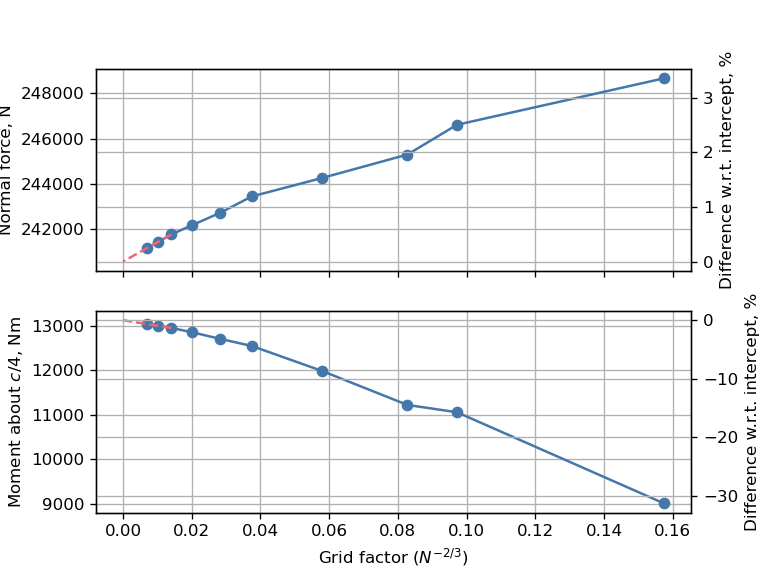

In [14]:
from scipy.stats import linregress

# Create figure with two subplots
fig, axes = plt.subplots(2, 1, sharex=True)

# Plot normal force vs grid factor
axes[0].plot(grid_factors, normal_force_array, 'o-')
axes[0].set_ylabel('Normal force, N')
axes[0].grid(True)

# Plot moment about c/4 vs grid factor
axes[1].plot(grid_factors, moment_array, 'o-')
axes[1].set_ylabel('Moment about $c/4$, Nm')
axes[1].grid(True)
axes[1].set_xlabel('Grid factor ($N^{-2/3}$)')

# Extract the last three points of both plots to calculate the Richardson extrapolation
last_three_gf = grid_factors[-3:]
last_three_normal_forces = normal_force_array[-3:]
last_three_moments = moment_array[-3:]

# Perform linear regression for normal force and moment and calculate intercepts of Richardson extrapolation lines
_, intercept_normal_force, _, _, _ = linregress(
    last_three_gf, last_three_normal_forces)
_, intercept_moment, _, _, _ = linregress(last_three_gf, last_three_moments)

# Plot Richardson extrapolation lines
axes[0].plot([grid_factors[-3], 0],
             [last_three_normal_forces[-3], intercept_normal_force],
             '--')
axes[1].plot([grid_factors[-3], 0],
             [last_three_moments[-3], intercept_moment],
             '--')

# Create a twin set of axes to plot percentage difference w.r.t. Richardson extrapolation lines intercepts
twin_scale = lambda y, y0: (y/y0 - 1)*100  # function to calculate percentage difference
intercepts_list = [intercept_normal_force, intercept_moment]  # list of intercepts
for i, intercept in enumerate(intercepts_list):  # loop over subplots
    twin_ax = axes[i].twinx()  # create twin axes
    ymin, ymax = axes[i].get_ylim()  # get y-axis limits of main axes
    twin_ax.set_ylim(twin_scale(ymin, intercept), twin_scale(ymax, intercept))  # set y-axis limits of twin axes to match percentage differences
    twin_ax.plot([], [])  # add empty plot to twin axes to ensure correct scaling
    twin_ax.set_ylabel('Difference w.r.t. intercept, %')  # set y-axis label of twin axes
    twin_ax.grid(True)  # enable grid for twin axes

# Show plot
plt.show()

We define the aerodynamic mesh to be converged at the first grid factor where the difference between the normal force and the intercept of the Richardson extrapolation line is less than 1%.

In [15]:
normal_forces_percentage_diff = twin_scale(
    normal_force_array, intercept_normal_force)  # calculate percentage differences for normal forces
converged_mesh_index = np.where(
    np.abs(normal_forces_percentage_diff) < 1)[0][0]  # find index corresponding to first percentage difference below 1
lattice_length_converged_mesh = lattice_lengths[converged_mesh_index]  # find lattice length corresponding to converged mesh
nchord_converged_mesh = round(CHORD/lattice_length_converged_mesh)  # find number of chordwise elements for converged mesh
nspan_converged_mesh = round(L/lattice_length_converged_mesh)  # find number of spanwise elements for converged mesh
print(f"""The mesh is converged for a target lattice length of
{lattice_length_converged_mesh*1e3:.1f} mm, corresponidng to
{nchord_converged_mesh:d} elements in the chordwise direction and to
{nspan_converged_mesh:d} elements in the spanwise direction.""")

The mesh is converged for a target lattice length of
975.3 mm, corresponidng to
7 elements in the chordwise direction and to
30 elements in the spanwise direction.


### Analysis of initial structure <a name="hard-nodes-initial"></a>

#### Linear buckling <a name="hard-nodes-initial-linear-buckling"></a>

The linear analysis is carried out by running SOL 144, reading the resulting aerodynamic loads transferred to the structural model, and using this load to run a linear buckling analysis with SOL 105. We print the critical buckling load factor and the corresponding total normal force, and we plot the critical buckling mode shape.

subcase=0 already exists...skipping


Nastran job sol_144_hns_initial.bdf completed
Wall time: 11.0 s


subcase=1 already exists...skipping


Nastran job sol_105_sol_144_hns_initial.bdf completed
Wall time: 15.0 s
Buckling load factor: 1.02
Total normal force corresponding to buckling load: 248608 N
Buckling mode:


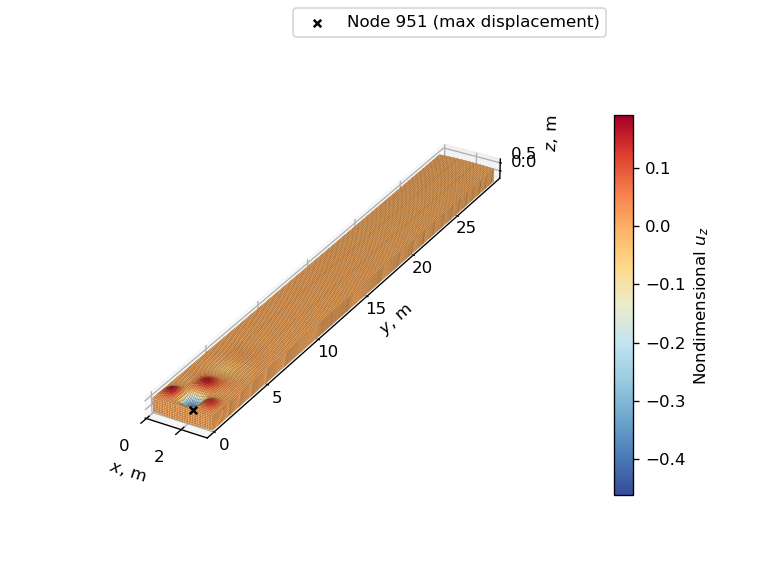

In [16]:
from resources import plot_utils, optimization_utils  # import box_beam_utils module from resources folder
import openmdao.api as om  # make available the most common OpenMDAO classes and functions

# Generate structural mesh of CRM-like Box Beam
target_cquad4_element_length = 112.6e-3  # [m] target length of CQUAD4 elements
struct_mesh = box_beam_utils.mesh_reinforced_box_beam_with_curved_skins(
    width=W, height=H, arc_height=h_a, ribs_y_coordinates=RIBS_Y_LOCATIONS,
    stiffeners_x_coordinates=stiffeners_x_locations, stiffeners_height=h_s,
    element_length=target_cquad4_element_length)

# Create base BDF input
nodes_xyz_array = struct_mesh.points
nodes_connectivity_matrix = struct_mesh.faces.reshape(-1, 5)[:, 1:]
base_bdf = box_beam_utils.create_base_bdf_input(
    young_modulus=E, poisson_ratio=nu, density=rho_material,
    shell_thickness=t0, nodes_xyz_array=nodes_xyz_array,
    nodes_connectivity_matrix=nodes_connectivity_matrix, parallel=True)

# Define property cards for the design segments
box_beam_utils.define_property_segments(
    bdf=base_bdf, ribs_y_locations=RIBS_Y_LOCATIONS)
    
# Set up SOL 144 with aerodynamic model
sol_144_bdf = base_bdf.__deepcopy__({})
paero_id = np.max(np.fromiter(sol_144_bdf.properties.keys(), dtype=int)) + 1
caero_id = int(10**np.ceil(
    np.log10(np.max(np.fromiter(sol_144_bdf.elements.keys(), dtype=int))))) + 1
set_up_sol_144(sol_144_bdf, trim_sid, mach_number, angle_of_attack, altitude)
define_aerodynamic_model(
    sol_144_bdf, paero_id, caero_id, nspan_converged_mesh,
    nchord_converged_mesh)

# Request output of stresses in op2 file and aerodynamic forces in pch file
sol_144_bdf.case_control_deck.subcases[0].add_result_type(
    'STRESS', 'ALL', ['PLOT'])
sol_144_bdf.case_control_deck.subcases[0].add_result_type(
    'TRIMF', 'ALL', ['AIR'])

# Create a deepy copy of the base BDF object and define hard nodes spline
hard_nodes_spline_bdf = sol_144_bdf.__deepcopy__({})
define_hard_nodes_spline(
    hard_nodes_spline_bdf, struct_mesh, caero_id, nspan_converged_mesh,
    nchord_converged_mesh, set1_sid)

# Define NastranGroup object with dummy BDF and input name
input_name = "sol_144_hns_initial"
sol_144_group = optimization_utils.NastranGroup(
        bdf=hard_nodes_spline_bdf,
        analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
        input_name=input_name, run_flag=False, yield_strength=SIGMA_Y)

# Define thickness spline component and connect it to the NastranSolver component
box_segments_eval_y_locations = RIBS_Y_LOCATIONS[0:-1] +\
    np.ediff1d(RIBS_Y_LOCATIONS)/2  # y-coordinates of the thickness evaluation points for each box segment
x_interp = np.sort(
    np.concatenate((RIBS_Y_LOCATIONS, box_segments_eval_y_locations)))  # combine and sort the y-coordinates of the control points of the stiffened box patches and the ribs
thickness_interp_comp = om.SplineComp(
    method='slinear', x_cp_val=np.array([0, L]), x_interp_val=x_interp)  # create linear spline component
thickness_interp_comp.add_spline(y_cp_name='t_cp', y_interp_name='t_val')  # add spline variables to the component
sol_144_group.add_subsystem('interp', thickness_interp_comp)  # add spline component to the group
sol_144_group.connect('interp.t_val', 'nastran_solver.t_val')  # connect spline component output to the NastranSolver component input

# Set up linear OpenMDAO problem
linear_aeroelastic_problem = om.Problem(
    model=sol_144_group, name="hard_nodes_linear_aeroelastic")
linear_aeroelastic_problem.setup()

#  Assign initial thickness and run model
initial_thickness_vector = t0*np.ones(2)  # constant initial thickness
linear_aeroelastic_problem.set_val('interp.t_cp', initial_thickness_vector)  # assign initial thickness vector to input of spline component
linear_aeroelastic_problem.run_model()  # run the model

# Get OP2 object from problem and print buckling load factor
sol_105_op2 = linear_aeroelastic_problem['nastran_solver.op2']
buckling_load_factor = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigr
print(f"Buckling load factor: {buckling_load_factor:.2f}")

# Find and print corresponding value of total normal force
buckling_normal_force = sol_105_op2.load_vectors[FIRST_SUBCASE_ID].data[
    :, :, Z_COMPONENT_INDEX].sum()*buckling_load_factor
print(f"""Total normal force corresponding to buckling load: {buckling_normal_force:.0f} N""")

# Define function to adjust axes ticks and labels' position
def adjust_3d_plot(axes, colorbar=None):
    axes.locator_params(axis="x", nbins=3)  # set number of ticks of x-axis
    axes.locator_params(axis="z", nbins=2)  # set number of ticks of z-axis
    axes.tick_params(axis="y", which="major", pad=20)  # adjust position of ticks' label of y-axis
    axes.tick_params(axis="z", which="major", pad=6)  # adjust position of ticks' label of z-axis
    axes.yaxis.labelpad = 80  # adjust position of y-axis's label
    axes.zaxis.labelpad = 10  # adjust position of z-axis's label
    if colorbar is not None:
        colorbar.ax.set_position(colorbar.ax.get_position().shrunk(1.0, .66))  # decrease colorbar size
        colorbar.ax.set_position(
            colorbar.ax.get_position().translated(-.05, .14))  # move colorbar upwards
    
# Plot critical buckling mode
amplification_factor = 1.5
print("Buckling mode:")
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz',
    colormap='sunset', displacement_amplification_factor=amplification_factor)
root_node_id = plot_utils.plot_max_displacement_node(
    axes=ax, op2=sol_105_op2,
    displacement_amplification_factor=amplification_factor)
ax.legend()
adjust_3d_plot(ax, cbar)
plt.show()

#### Nonlinear analysis <a name="hard-nodes-initial-nonlinear-analysis"></a>

For the nonlinear analysis, we freeze the aerodynamic loads calculated by the linear aeroelastic analysis and we run a nonlinear analysis with SOL 106. This approach is not strictly correct, as the aerodynamic loads should be recalculated at each iteration of the nonlinear analysis. However, there is no easy way to perform this operation in Nastran and we consider this approach as a reasonable approximation for the purpose of this notebook. Similarly to our previous notebooks, we scale the aerodynamic loads by twice the buckling load factor to explore the nonlinear structural stability response of the CRM-like Box Beam.

In [17]:
# Setup SOL 106 with arc-length method
sol_106_bdf = base_bdf.__deepcopy__({})
pynastran_utils.set_up_arc_length_method(
        bdf=sol_106_bdf, max_iter=3, conv='PU', eps_u=1e-5, eps_p=1e-5,
        max_bisect=20, minalr=1e-5, desiter=4, maxinc=450)

# Apply frozen aerodynamic load obtained from SOL 144
pch_filename = input_name + '.pch'
sol_106_bdf.add_include_file(pch_filename)

# Create load case with frozen aerodynamic load scaled to twice the linear
# buckling load
scale_factor = buckling_load_factor*2
sol_106_bdf.add_load(sid=LOAD_SET_ID, scale=1., scale_factors=[scale_factor],
                     load_ids=[FORCE_SET_ID])  # add LOAD card
pynastran_utils.create_static_load_subcase(
        bdf=sol_106_bdf, subcase_id=FIRST_SUBCASE_ID, load_set_id=LOAD_SET_ID)  # create subcase with static load

# Set up nonlinear analysis with calculation of tangent stiffness matrix eigenvalues
pynastran_utils.set_up_sol_106_with_kllrh_eigenvalues(
        bdf=sol_106_bdf, analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
        method_set_id=METHOD_SET_ID, no_eigenvalues=NO_EIGENVALUES,
        upper_eig=UPPER_EIGENVALUE)

# Request nonlinear stress results of all elements in the op2 file
sol_106_bdf.case_control_deck.subcases[0].add_result_type(
        'NLSTRESS', 'ALL', ['PLOT'])

# Create NastranGroup object
input_name = "sol_106_hns_initial"
sol_106_group = optimization_utils.NastranGroup(
        bdf=sol_106_bdf, analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
        input_name=input_name, run_flag=False, yield_strength=SIGMA_Y)  # create NastranGroup object

# Add thickness spline component and connect it to the NastranSolver component
sol_106_group.add_subsystem('interp', thickness_interp_comp)
sol_106_group.connect('interp.t_val', 'nastran_solver.t_val')

# Set up nonlinear OpenMDAO problem
nonlinear_problem = om.Problem(
        model=sol_106_group, name="hard_nodes_nonlinear")
nonlinear_problem.setup()

# Assign initial thickness distribution and run model
nonlinear_problem.set_val('interp.t_cp', initial_thickness_vector)  # assign thickness array to spline component input
nonlinear_problem.run_model()  # run analysis

Nastran job sol_106_hns_initial.bdf completed
Wall time: 15475.0 s


We plot the eigenvalue diagram.

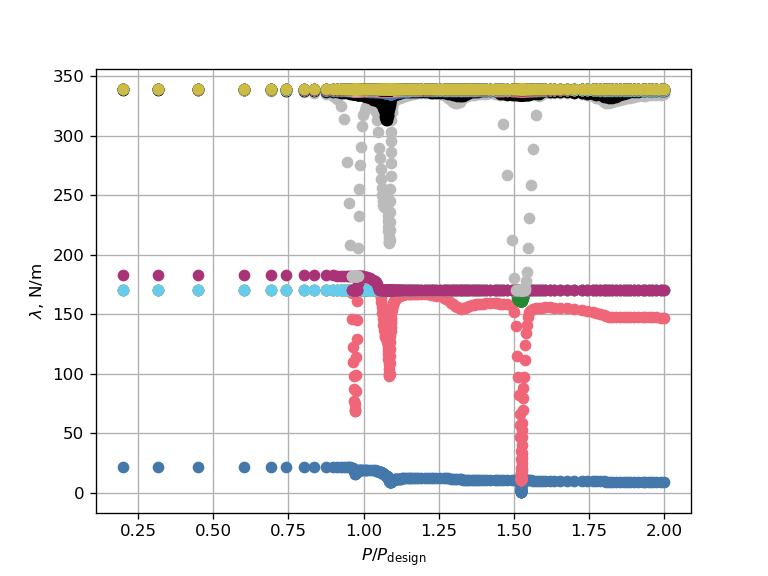

In [18]:
# Retrieve OP2 object
sol_106_op2 = nonlinear_problem['nastran_solver.op2']  # get OP2 object from the problem

# Find id of tip node
tip_node_xyz = np.array([W/2, L, 0])  # tip node is taken at the center of the tip rib
tip_node_id = np.argmin(
    np.linalg.norm(struct_mesh.points - tip_node_xyz, axis=1)) + 1

# Read load and displacment histories from OP2 object
plot_nodes_ids = [root_node_id, tip_node_id]  # list of node ids where displacement is monitored
load_factors, _, displacements =\
    pynastran_utils.read_load_displacement_history_from_op2(
        op2=sol_106_op2, node_ids=plot_nodes_ids)
nondimensional_loads = load_factors[FIRST_SUBCASE_ID]*2  # load factor goes from 0 to 1, nondimensional load goes to 0 to 2 (applied load is nondimensionalized with linear buckling load)

# Read eigenvalues from f06 file
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path of f06 file
eigenvalues = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)  # read eigenvalues from f06 file

# Plot eigenvalues vs applied load
_, ax = plot_utils.plot_eigenvalue_diagram(nondimensional_loads, eigenvalues)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
plt.show()

The eigenvalue diagram does not appear to show any region of instability, even if the smallest eigenvalue gets very close to zero at approximately $P/P_\mathrm{design}=1.52$. However, by zooming into this part of the diagram, we can spot a discontinuity in the trend of the smallest eigenvalue. In fact, the eigenvalue decreases until it is very close to zero and then it jumps to a higher value that is associated with a smaller applied load. Both the applied load and the eigenvalue increase from this point. The trajectory of the eigenvalue hints at the fact that the arc-length solver might have missed the region of instability with negative eigenvalues between the two mentioned points. To find out whether this is the case we need to rerun the analysis with tigther convergence tolerances.

We inspect the f06 file at the converged increment where the eigenvalue jumps.

```raw
                        - - - CONVERGENCE  FACTORS - - -                      - - - LINE SEARCH DATA - - -
0ITERATION      EUI         EPI         EWI      LAMBDA       DLMAG       FACTOR     E-FIRST     E-FINAL   NQNV  NLS  ENIC  NDV  MDV

         3  5.7447E-06  2.7356E-07  1.3623E-13  1.0000E-01  1.0893E-06  1.0000E+00  0.0000E+00  0.0000E+00    0    0          0    1
 *** USER INFORMATION MESSAGE 6186 (NCONVG)
     *** SOLUTION HAS CONVERGED ***
         SUBID    1     LOOPID  177     LOAD STEP    0.762     LOAD FACTOR 0.76249401
```

The displacement error function has a value of approximately $5.7\cdot 10^{-6}$, while the load error function has a value of approximately $2.7\cdot 10^{-7}$. To ensure that the analysis does not converge at this iteration and that the increment is bisected, we halve the current convergence tolerance for both displacement and load error functions from $10^{-5}$ to $5\cdot 10^{-6}$ and rerun the analysis with these new tolerances.

In [19]:
sol_106_bdf.nlparms[1].eps_u = 5e-6
sol_106_bdf.nlparms[1].eps_p = 5e-6
input_name = "sol_106_hns_initial_epsu5e-6"
nonlinear_problem.model.nastran_solver.options['input_name'] = input_name
nonlinear_problem.run_model()

Nastran job sol_106_hns_initial_epsu5e-6.bdf completed
Wall time: 22889.0 s


We plot again the eigenvalue diagram.

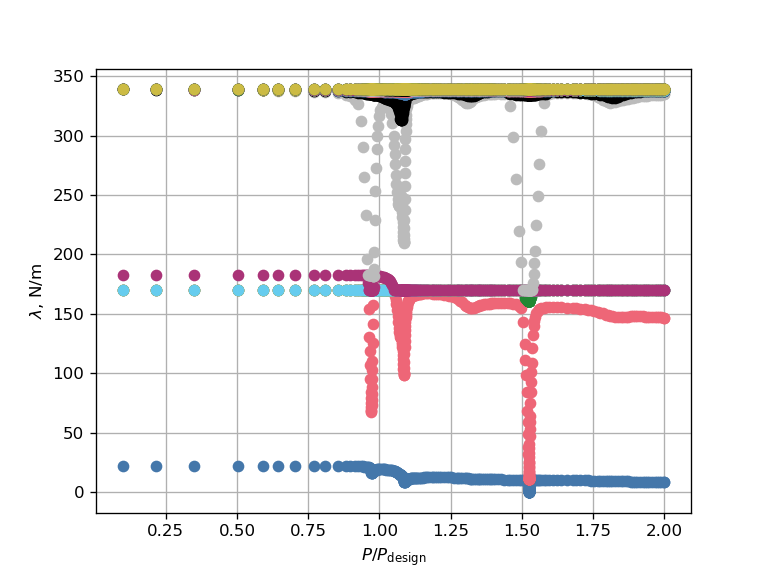

In [20]:
# Retrieve OP2 object
sol_106_op2 = nonlinear_problem['nastran_solver.op2']  # get OP2 object from the problem

# Find id of tip node
tip_node_xyz = np.array([W/2, L, 0])  # tip node is taken at the center of the tip rib
tip_node_id = np.argmin(
    np.linalg.norm(struct_mesh.points - tip_node_xyz, axis=1)) + 1

# Read load and displacment histories from OP2 object
plot_nodes_ids = [root_node_id, tip_node_id]  # list of node ids where displacement is monitored
load_factors, _, displacements =\
    pynastran_utils.read_load_displacement_history_from_op2(
        op2=sol_106_op2, node_ids=plot_nodes_ids)
nondimensional_loads = load_factors[FIRST_SUBCASE_ID]*2  # load factor goes from 0 to 1, nondimensional load goes to 0 to 2 (applied load is nondimensionalized with linear buckling load)

# Read eigenvalues from f06 file
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path of f06 file
eigenvalues = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)  # read eigenvalues from f06 file

# Plot eigenvalues vs applied load
_, ax = plot_utils.plot_eigenvalue_diagram(nondimensional_loads, eigenvalues)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
plt.show()

Zooming again into the same part of the eigenvalue diagram, we can still see a discontinuity in the trend of the smallest eigenvalue, but now the analysis has successfully captured a part of the region of instability with negative eigenvalues.

Successively, we try to visualize this region of instability in the load-displacement diagrams of the root and tip displacements. At the same time, we note that the region of instability is extremely small, and consequently we expect it to be hardly noticed in the load-displacement diagrams.

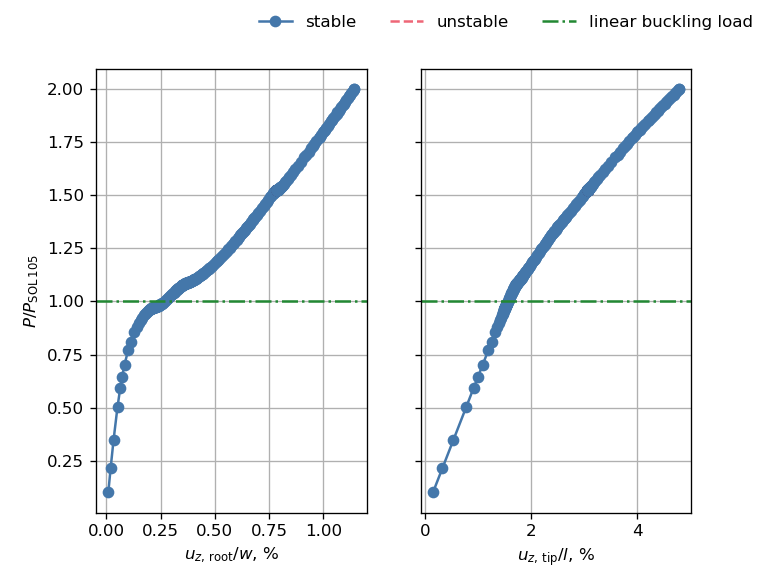

In [21]:
# Create lists of reference lengths and labels for the load-displacement plots
displacement_labels = ["root", "tip"]  # labels for the displacements
reference_lengths = [W, L]  # reference lengths for the displacements
reference_lengths_labels = ["w", "l"]  # reference labels for the displacements

# Create figure with two subplots
fig, axes = plt.subplots(1, 2, sharey=True)

# Loop over the subplots
for i, label in enumerate(displacement_labels):
    nondimensional_disp = displacements[plot_nodes_ids[i]][FIRST_SUBCASE_ID][
        :, Z_COMPONENT_INDEX]/reference_lengths[i]*100
    plot_utils.plot_2d_load_displacements_stability(  # plot load-displacement curve highlighting stable and unstable segments
            axes[i],
            nondimensional_disp,
            nondimensional_loads,
            eigenvalues,
            MARKERS[0],
            COLORS[0])
    axes[i].axhline(y=1., color=GLASS_CEILING_COLOR, linestyle='-.')      # plot glass ceiling line
    axes[i].set_xlabel(
        f"$u_{{z,\,\mathrm{{{label}}}}}/{reference_lengths_labels[i]}$, %")  # set x-axis label
    axes[i].grid(visible=True)  # enable grid
axes[0].set_ylabel("$P/P_\mathrm{SOL\,105}$")  # set y-axis label

# Add legend and show plot
stable_line = Line2D(
    [0], [0], linestyle='-', marker=MARKERS[0], color=COLORS[0],
    label="stable")  # create proxy artist for stable segments
unstable_line = Line2D(
    [0], [0], linestyle='--', color=UNSTABLE_COLOR, label="unstable")  # create proxy artist for unstable segments
glass_ceiling_line = Line2D(
    [0], [0], linestyle='-.', color=GLASS_CEILING_COLOR,
    label="linear buckling load")  # create proxy artist for glass ceiling
fig.legend(
    handles=[stable_line, unstable_line, glass_ceiling_line], frameon=False,
    ncol=3)  # add legend
plt.show()

Plot deformation before and after snap.

Nondimensional applied load at first instability:
      1.52
Deformation before snap-through:


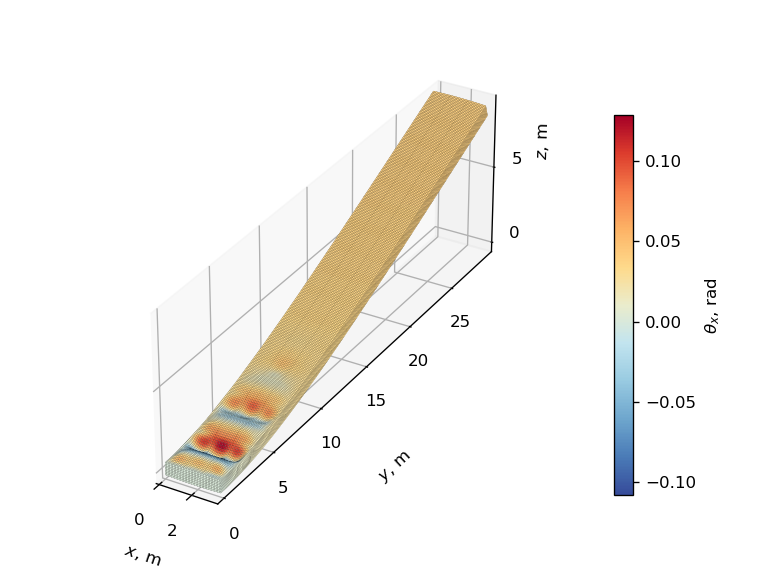

Deformation after snap-through:


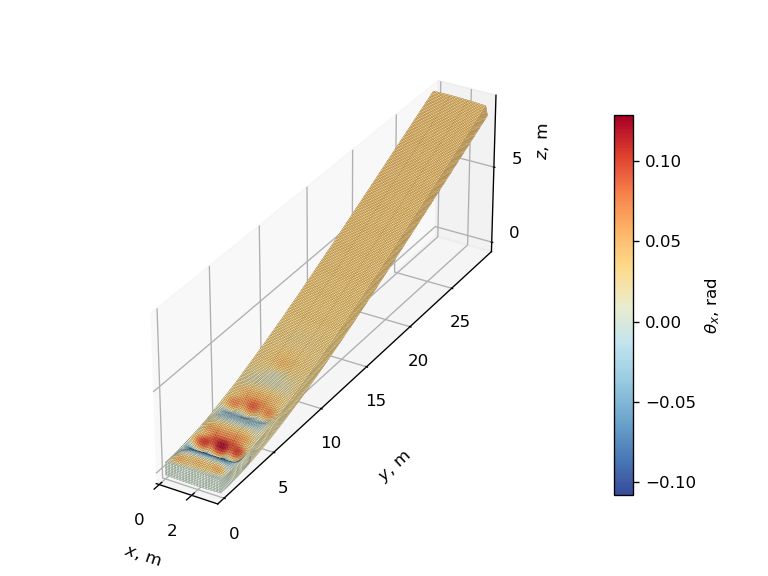

In [22]:
# Find index of first negative eigenvalue and print nondimensional applied load
# at first instability
first_negative_eigenvalue_index = np.where(eigenvalues[0] < 0)[0][0]
print(f"""Nondimensional applied load at first instability:
      {nondimensional_loads[first_negative_eigenvalue_index]:.2f}""")

# Plot deformation before snap-through
print("Deformation before snap-through:")
amplification_factor = 10  # amplification factor for displacements
_, ax, cbar = plot_utils.plot_deformation(
    op2=sol_106_op2, load_step=first_negative_eigenvalue_index,
    displacement_component='rx', colormap='sunset',
    displacement_amplification_factor=amplification_factor)
adjust_3d_plot(ax, cbar)
plt.show()

# Plot deformation after snap-through
offset_index = first_negative_eigenvalue_index + 1
index_after_snap = offset_index + np.argmax(
        nondimensional_loads[offset_index:] >= nondimensional_loads[
            first_negative_eigenvalue_index - 1])
print("Deformation after snap-through:")
_, ax, cbar = plot_utils.plot_deformation(
    op2=sol_106_op2, load_step=index_after_snap + 1,
    displacement_component='rx', colormap='sunset',
    displacement_amplification_factor=amplification_factor)
adjust_3d_plot(ax, cbar)
plt.show()

Before the snap, we note that the deformation over the top skin is characterized by a global buckling of the panels between consecutive ribs. At the same time, we can hardly notice any difference in the deformation before and after the snap-through. This is something that we could have expected, as the region of instability is extremely small and consequently the snap-through is very weak.

### Linear buckling optimization <a name="hard-nodes-linear-optimization"></a>

We store and print initial values of objective and constraint functions.

In [23]:
mass_0 = linear_aeroelastic_problem['nastran_solver.mass'][0]
ks_buckling_0 = linear_aeroelastic_problem['nastran_solver.ks_buckling'][0]
ks_stress_0 = linear_aeroelastic_problem['nastran_solver.ks_stress'][0]
print(f"""Initial KS value for buckling load factor: {ks_buckling_0:.3f}
Initial KS value for stress: {ks_stress_0:.3e} Pa
Initial mass: {mass_0:.0f} kg""")

Initial KS value for buckling load factor: -0.015
Initial KS value for stress: -3.236e+08 Pa
Initial mass: 26467 kg


We set up the optimization, run it and plot the optimization history.

Requested variables at last iteration:
- interp.t_cp: [0.01612872 0.00174289]
- nastran_solver.ks_buckling: [0.00119758]
- nastran_solver.ks_stress: [-3.25078176e+08]
- nastran_solver.mass: [15357.38662552]


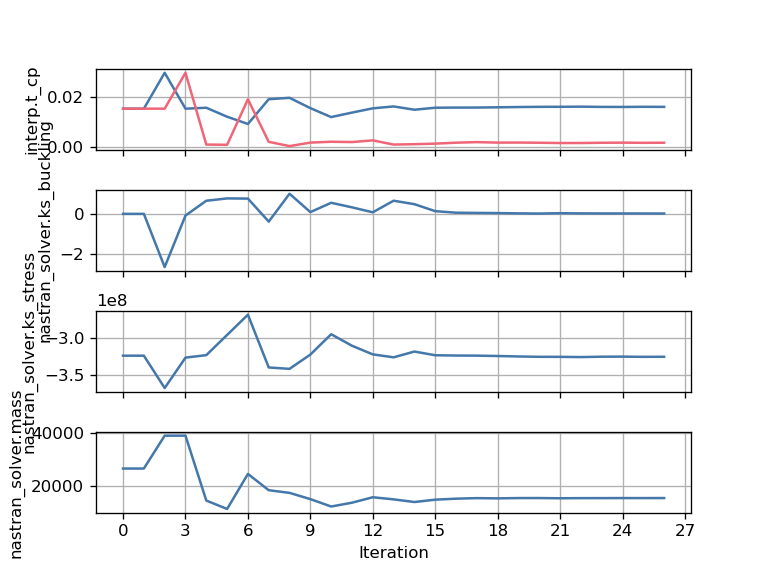

In [24]:
# Change default name of input file
input_name = "sol_144_hns_linear_opt"
linear_aeroelastic_problem.model.options['input_name'] = input_name

# Set initial thickness vector for optimization
linear_aeroelastic_problem.model.set_input_defaults(
    'interp.t_cp', initial_thickness_vector)

# Choose optimizer
linear_aeroelastic_problem.driver = om.ScipyOptimizeDriver()
linear_aeroelastic_problem.driver.options['optimizer'] = 'COBYLA'
linear_aeroelastic_problem.driver.options['tol'] = OPTIMIZER_TOLERANCE

# Add design variable, objective and constraints
thickness_bounds = [1e-3, t0*2]  # [m] - thickness can vary between 1 mm and twice the initial thickness
linear_aeroelastic_problem.model.add_design_var(
    'interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1],
    ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
linear_aeroelastic_problem.model.add_objective(
    'nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
linear_aeroelastic_problem.model.add_constraint('nastran_solver.ks_buckling', upper=0.)  # KS function for buckling load factor is not scaled because buckling load factor is already a ratio
linear_aeroelastic_problem.model.add_constraint(
    'nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1

# Add recorder to the driver
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
linear_aeroelastic_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
linear_aeroelastic_problem.setup()  # re-setup problem before running optimization
linear_aeroelastic_problem.set_solver_print(0)  # disable solver output
linear_aeroelastic_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    linear_aeroelastic_problem.run_driver()  # run optimization
linear_aeroelastic_problem.cleanup()  # clean up problem

# Plot optimization history and print results
_, _, linear_opt_histories = optimization_utils.plot_optimization_history(
    recorder_filepath)  # plot optimization history

The optimization does not end on a feasible design point. For this reason we take as final design point the one with the buckling constraint function smaller than $10^{-3}$.

In [25]:
# Find index of last feasible design
feasible_design_index = np.where(
    linear_opt_histories['nastran_solver.ks_buckling'][:, 0] <\
        OPTIMIZER_TOLERANCE)[0][-1]

# Print design variables, constraints and objective at last feasible iteration
print("Design variables, constraints and objective at last feasible iteration:")
for key in linear_opt_histories:
    print(f"- {key}: {linear_opt_histories[key][feasible_design_index]}")

# Find and print mass percentage variation w.r.t. initial structure
mass_percentage_variation = (linear_opt_histories['nastran_solver.mass'][
    feasible_design_index, 0]/mass_0 - 1)*100
print(f"""
Mass variation w.r.t. initial structure: {mass_percentage_variation:.1f} %""")

Design variables, constraints and objective at last feasible iteration:
- interp.t_cp: [0.016139   0.00173281]
- nastran_solver.ks_buckling: [9.45329666e-05]
- nastran_solver.ks_stress: [-3.25133248e+08]
- nastran_solver.mass: [15357.55921865]

Mass variation w.r.t. initial structure: -42.0 %


Run analysis of last feasible design and plot critical buckling mode of the optimized structure.

Nastran job sol_144_hns_linear_opt_feasible.bdf completed
Wall time: 11.0 s


subcase=1 already exists...skipping


Nastran job sol_105_sol_144_hns_linear_opt_feasible.bdf completed
Wall time: 59.0 s


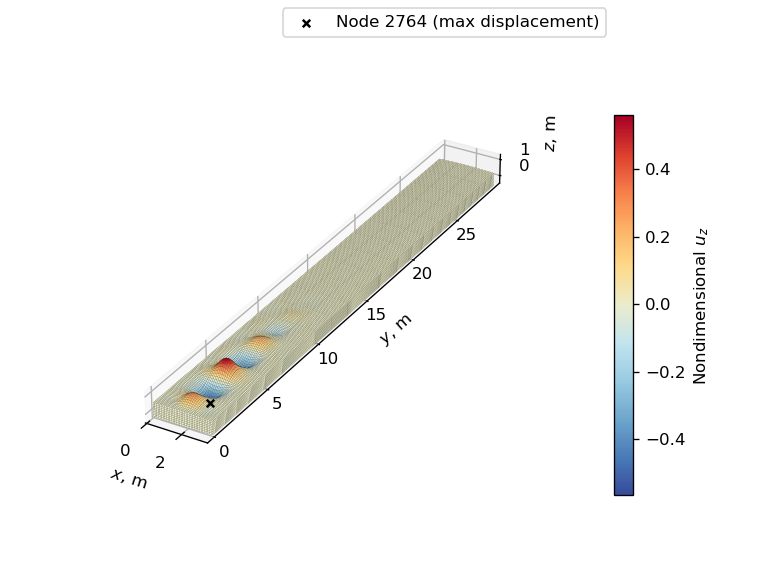

In [26]:
# Run analysis of last feasible design
linear_opt_thickness_vector = linear_opt_histories['interp.t_cp'][
    feasible_design_index]
linear_aeroelastic_problem.set_val('interp.t_cp', linear_opt_thickness_vector)
input_name = "sol_144_hns_linear_opt_feasible"
linear_aeroelastic_problem.model.nastran_solver.options['input_name'] = input_name
linear_aeroelastic_problem.run_model()

# Get OP2 object and plot critical buckling mode
sol_105_op2 = linear_aeroelastic_problem['nastran_solver.op2']
amplification_factor = 1.5
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz',
    colormap='sunset',
    displacement_amplification_factor=amplification_factor)
max_disp_node_id = plot_utils.plot_max_displacement_node(
        axes=ax, op2=sol_105_op2,
        displacement_amplification_factor=amplification_factor)
ax.legend()
adjust_3d_plot(ax, cbar)
plt.show()

The critical buckling mode of the linearly optimized structure is characterized by a local buckling of the central rib-stiffener top skin panels over the root, where the maximum displacement occurs for the second panel from the root.

We also check the total normal force resulting from the aerodynamic loads of the optimized structure. In fact, this time the load is not kept constant during the optimization, but it is recalculated at each iteration with the linear aeroelastic analysis. Since the results of the linear aeroelastic analysis depend on the thickness distribution along the wingbox, the applied load itself is a function of the design variables.

In [27]:
total_normal_force = sol_105_op2.load_vectors[FIRST_SUBCASE_ID].data[
    :, :, Z_COMPONENT_INDEX].sum()
print(f"""Total normal force applied to linearly optimized structure: {total_normal_force:.0f} N""")

Total normal force applied to linearly optimized structure: 245431 N


This total normal force is also that corresponding to the buckling load of the optimized structure, as the buckling load factor is approximately equal to 1. The total normal force corresponding to the buckling load of the initial structure with uniform thickness was approximately 249 kN, and this value has now decreased to approximately 245 kN. In aeroelastic optimization is common to have a decrease in the aerodynamic loads as the structure becomes lighter, since the overall MTOW decreases and less lift is required for the 2.5g maneuver. However, in our case we are not performing any trim analysis to establish the required lift, but we have a fixed angle of attach and dynamic pressure. Consequently, the decrease in the aerodynamic loads can only be attributed to the increased flexibility of the optimized structure.

Now we set up the nonlinear OpenMDAO problem to perform the nonlinear analysis of the linearly optimized structure

In [28]:
# Change punch file of frozen aerodynamic load
sol_106_bdf.reject_lines[0][0] = f"INCLUDE '{input_name}.pch'"

# Scale applied load to twice the frozen aerodynamic load
sol_106_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = 2.

# Change default name of input file
input_name = "sol_106_hns_linear_opt"
nonlinear_problem.model.options['input_name'] = input_name
  
# Assign linearly optimized thickness vector and run model
nonlinear_problem.setup()
nonlinear_problem.set_val('interp.t_cp', linear_opt_thickness_vector)
nonlinear_problem.run_model()

Nastran job sol_106_hns_linear_opt.bdf completed
Wall time: 42098.0 s


Plot eigenvalue diagram.

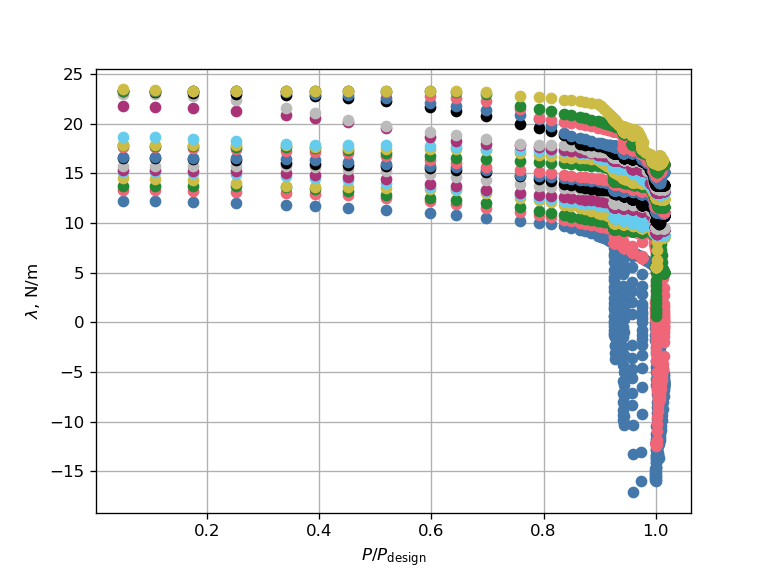

In [29]:
# Read displacements, loads and eigenvalues
sol_106_op2 = nonlinear_problem['nastran_solver.op2']  # get OP2 object from the problem
plot_nodes_ids = [root_node_id, max_disp_node_id, tip_node_id]  # list of node ids to plot
load_factors, _, displacements =\
    pynastran_utils.read_load_displacement_history_from_op2(
        op2=sol_106_op2, node_ids=plot_nodes_ids)  # read applied loads from OP2 object
nondimensional_loads = load_factors[FIRST_SUBCASE_ID]*2
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path of f06 file
eigenvalues = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)  # read eigenvalues from f06 file

# Plot eigenvalues vs applied load
_, ax = plot_utils.plot_eigenvalue_diagram(nondimensional_loads, eigenvalues)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

Different regions of instability can be observed starting from $P/P_\mathrm{design}=0.9$. This means that the nonlinear critical load is lower than the linear buckling load, which indicates that the linear buckling analysis not conservative. We plot the eigenvalues against the cumulative sum of the absolute value of the arc-length increments to get a clearer visualization of the regions of instability.

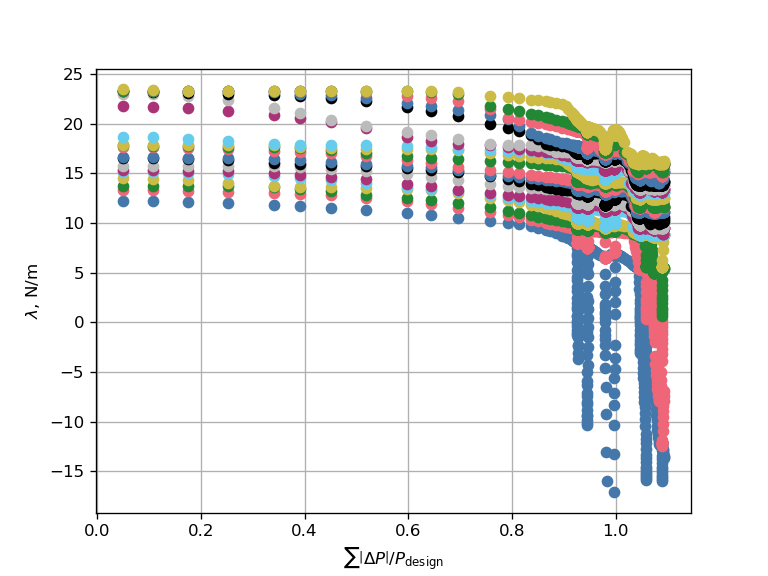

In [30]:
_, ax = plt.subplots()
cumsum_nondimensional_loads = np.cumsum(
    np.abs(np.diff(np.insert(nondimensional_loads[:-1], 0, 0.))))  # cumulative sum of load increments
ax.plot(cumsum_nondimensional_loads, eigenvalues.T, 'o')  # convert eigenvalues from N/mm to N/m
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel(r"$\sum \left|\Delta P\right|/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

Zooming into the plot and comparing with the previous eigenvalue diagram, we can spot four regions of instability for $P/P_\mathrm{design}<1$ with increasing strength. Beyond the design load we observe a fifth small region of instability, and immediately after a stronger sixth region of instability that persists until the end of the analysis.

We try to visualize these regions of instability in the load-displacement diagram, considering not only the root and tip displacements but also the displacements of the node at the center of the second top skin panel from the root.

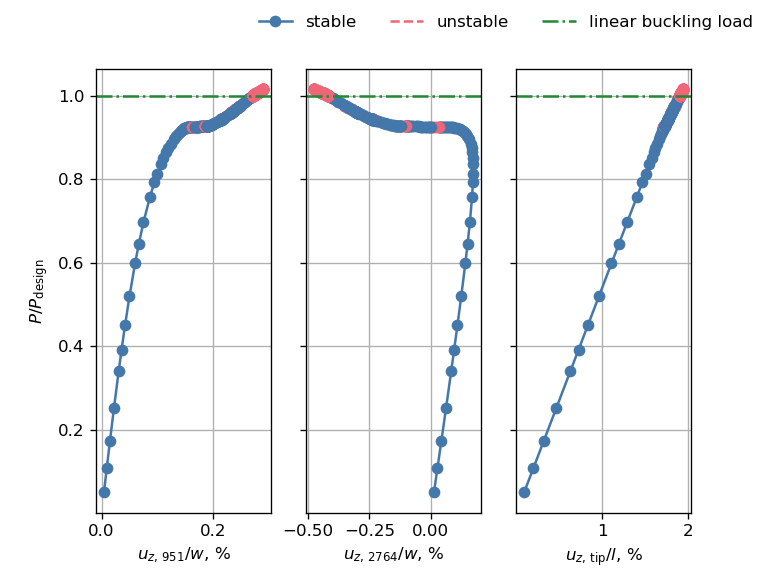

In [31]:
# Create lists of reference lengths and labels for the load-displacement plots
displacement_labels = [
    f"{plot_nodes_ids[0]:d}", f"{plot_nodes_ids[1]:d}", "tip"]  # labels for the displacements
reference_lengths = [W, W, L]  # reference lengths for the displacements
reference_lengths_labels = ["w", "w", "l"]  # reference labels for the displacements

# Create figure with two subplots
fig, axes = plt.subplots(1, 3, sharey=True)

# Loop over the subplots
for i, label in enumerate(displacement_labels):
    nondimensional_disp = displacements[plot_nodes_ids[i]][FIRST_SUBCASE_ID][
        :, Z_COMPONENT_INDEX]/reference_lengths[i]*100
    plot_utils.plot_2d_load_displacements_stability(  # plot load-displacement curve highlighting stable and unstable segments
            axes[i],
            nondimensional_disp,
            nondimensional_loads,
            eigenvalues,
            MARKERS[0],
            COLORS[0])
    axes[i].axhline(y=1., color=GLASS_CEILING_COLOR, linestyle='-.')      # plot glass ceiling line
    axes[i].set_xlabel(
        f"$u_{{z,\,\mathrm{{{label}}}}}/{reference_lengths_labels[i]}$, %")  # set x-axis label
    axes[i].grid(visible=True)  # enable grid
axes[0].set_ylabel("$P/P_\mathrm{design}$")  # set y-axis label

# Add legend and show plot
fig.legend(handles=[stable_line, unstable_line, glass_ceiling_line],
           frameon=False, ncol=3)  # add legend
plt.show()

The first two regions of instability are clearly visible in the diagrams of the local displacements and are very close in terms of the applied load. The other regions of instability are hidden behind the stable equilibrium points, indicating that they likely involve other parts of the structure.

To shed light on the parts of the structure involved in the different snap-throughs, we repeat the analysis storing the eigenvectors of the tangent stiffness matrix.

In [32]:
# Change dmap to store eigenvectors
dmap_eigenvectors = sol_106_bdf.executive_control_lines[1].replace(
    "eigenvalues_nobuckle", "eigenvectors")  # get include string for DMAP to store eigenvectors
sol_106_bdf.executive_control_lines[1] = dmap_eigenvectors  # change DMAP command

# Change name of input file
input_name = "sol_106_hns_linear_opt_eigenvectors"
nonlinear_problem.model.nastran_solver.options['input_name'] = input_name

# Run model
nonlinear_problem.run_model()

Nastran job sol_106_hns_linear_opt_eigenvectors.bdf completed
Wall time: 43018.0 s


Now we plot the eigenvectors corresponding to the negative eigenvalues of the first four instabilities, which occur for $P/P_\mathrm{design}<1$.

Eigenvector of instability 1, P/P_design=0.93:


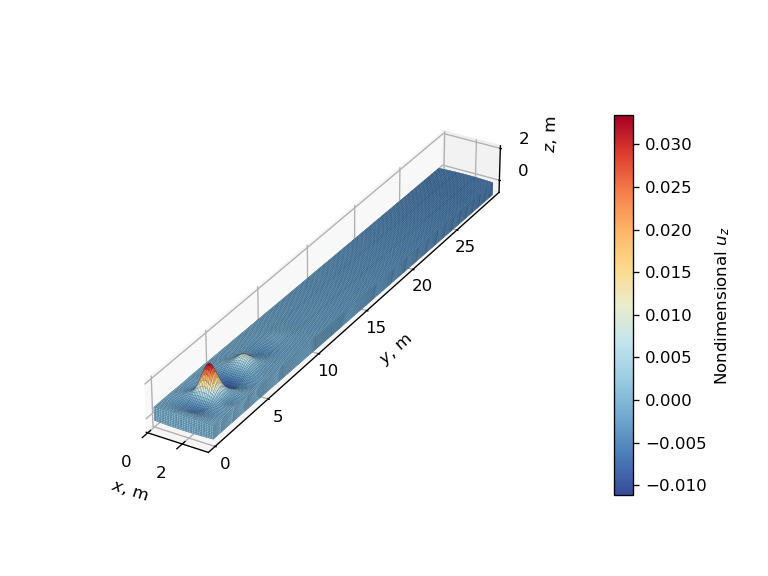

Eigenvector of instability 2, P/P_design=0.93:


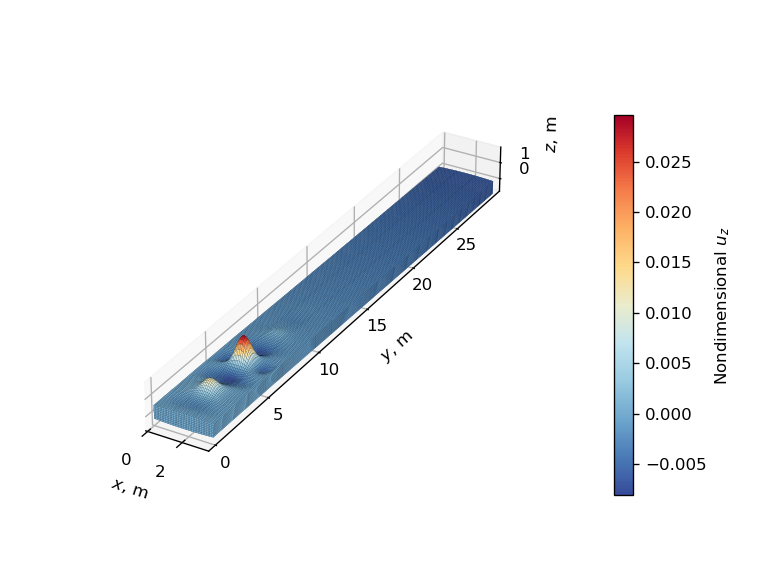

Eigenvector of instability 3, P/P_design=0.94:


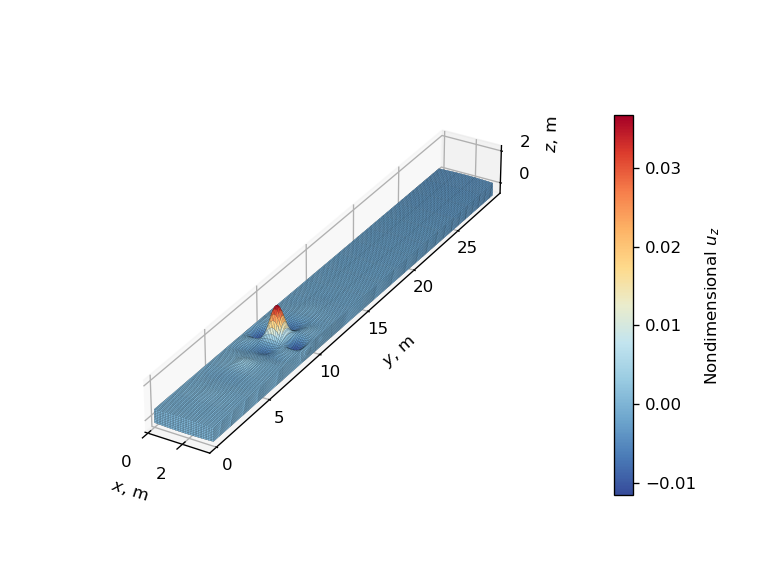

Eigenvector of instability 4, P/P_design=0.98:


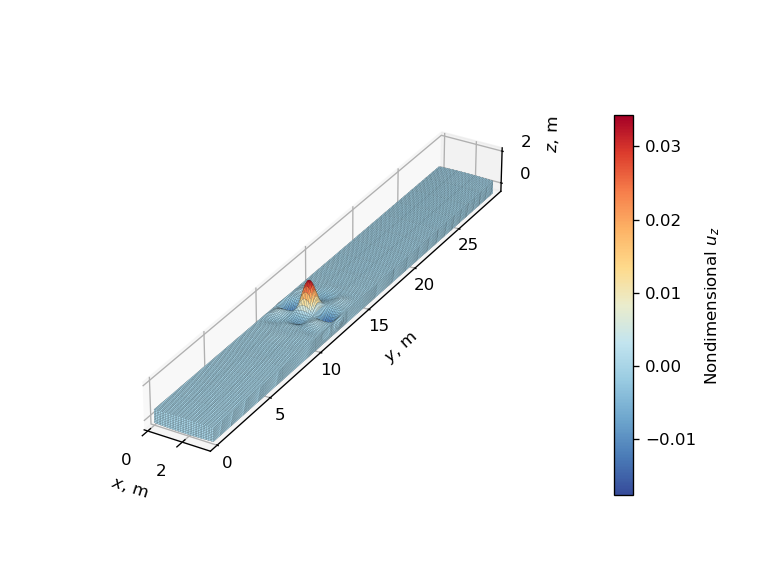

In [33]:
# Function to find indices where the number of negative eigenvalues increases between increments
def find_negative_eigenvalue_increases(eigenvalues, eigrs):
    """
    Find indices in eigrs where the number of negative eigenvalues
    increases between consecutive increments, accounting for nans in the
    eigenvalues array.
    
    Parameters
    ----------
    eigenvalues: ndarray
        2D array of shape (n_eigenvalues, n_increments) containing
        eigenvalues for each increment, may contain nans
    eigrs: list
        list containing all non-nan eigenvalues listed sequentially
    
    Returns
    -------
    (eigenvalues_increase_indices, eigrs_increase_indices): tuple
        indices where increases occur and number of negative eigenvalues
        at each increment
    """
    # Convert eigrs to numpy array
    eigrs_array = np.array(eigrs)
    
    # Get number of increments
    _, n_increments = eigenvalues.shape
    
    # Count valid (non-nan) eigenvalues per increment
    valid_counts = np.sum(~np.isnan(eigenvalues), axis=0)
    
    # Count negative eigenvalues per increment
    neg_counts = np.zeros(n_increments)
    current_idx = 0
    
    # Store the indices in eigrs where each increment starts
    increment_start_indices = np.zeros(n_increments, dtype=int)
    
    for i in range(n_increments):
        count = valid_counts[i]
        # Count negative eigenvalues in this increment
        neg_counts[i] = np.sum(
            eigrs_array[current_idx:current_idx + count] < 0)
        increment_start_indices[i] = current_idx
        current_idx += count
        
    # Find indices of columns where number of negative eigenvalues increases
    eigenvalues_increase_indices = np.where(np.diff(neg_counts) > 0)[0] + 1
    
    # Find where number of negative eigenvalues increases
    eigrs_increase_indices = increment_start_indices[
        eigenvalues_increase_indices]
    
    # Return the indices where increases occur and the number of negative eigenvalues at each increment
    return eigenvalues_increase_indices, eigrs_increase_indices

# Find the indices corresponding to the instabilities
sol_106_op2 = nonlinear_problem['nastran_solver.op2']  # get OP2 object from the problem
eigenvalues = pynastran_utils.read_kllrh_lowest_eigenvalues_from_op2(
    sol_106_op2)  # read eigenvalues from OP2 object
eigenvectors_key = next(iter(sol_106_op2.eigenvectors))  # get the key of the subcase containing the eigenvectors
increment_instability_indices, plot_instability_indices =\
    find_negative_eigenvalue_increases(
        eigenvalues, sol_106_op2.eigenvectors[eigenvectors_key].eigrs)

# Plot the eigenvectors of the first four instabilities
amplification_factor = 50
for i in range(4):
    print(f"Eigenvector of instability {i + 1}, P/P_design={nondimensional_loads[increment_instability_indices[i]]:.2f}:")
    _, ax, cbar = plot_utils.plot_eigenvector(
        op2=sol_106_op2, subcase_id=eigenvectors_key,
        eigenvector_number=plot_instability_indices[i] + 1,
        displacement_component='tz', colormap='sunset',
        displacement_amplification_factor=amplification_factor)
    adjust_3d_plot(ax, cbar)
    plt.show()

The first four instabilities involve mainly the central rib-stiffener top skin panels, and the maximum displacement occurs in order in the second, fourth, sixth and eigth panel from the root. As the maximum displacement moves from the root to the tip, the out-of-plane displacement of the front and rear rib-stiffener panels increases.

Finally, we plot the eigenvectors corresponding to the negative eigenvalues of the last two instabilities, which occur for $P/P_\mathrm{design}>1$.

Eigenvector of instability 5, P/P_design=1.01:


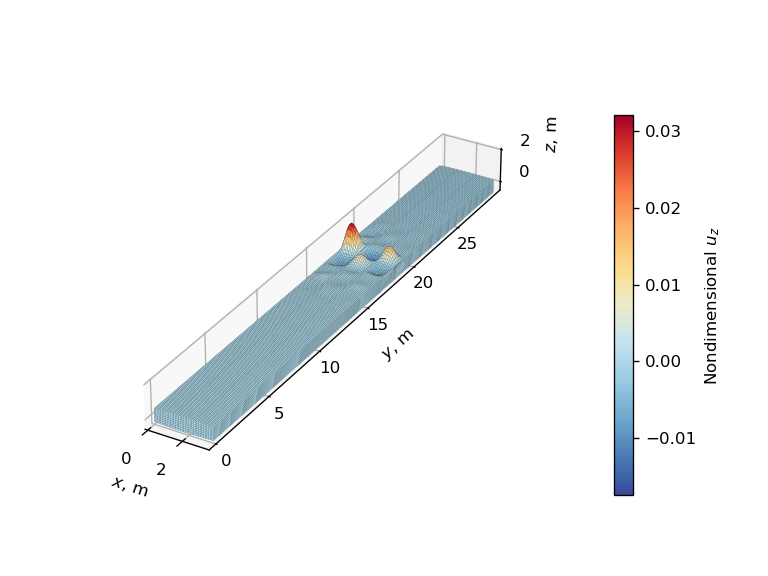

Eigenvector of instability 6, P/P_design=1.01:


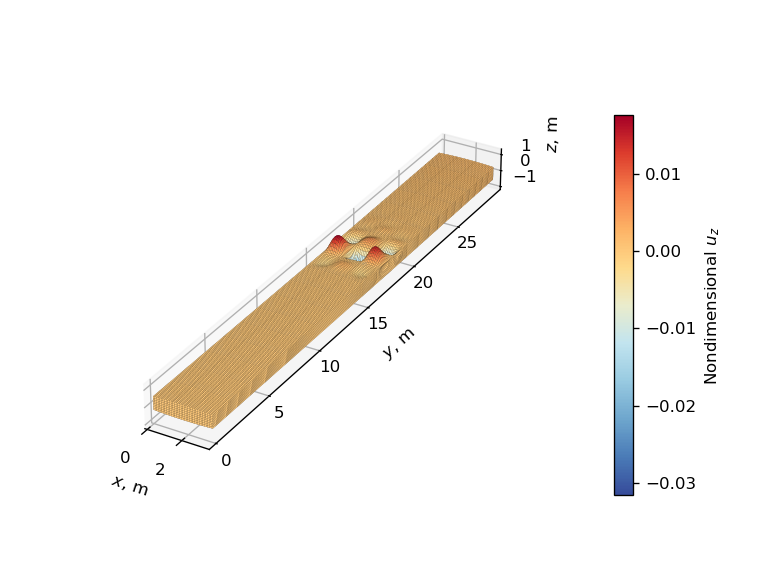

In [34]:
for i in [5, 6]:  # we skip i=4 because it corresponds to where the negative eigenvalue of the fourth instability returns in the range of the Lanczos eigensolver
    print(f"Eigenvector of instability {i}, P/P_design={nondimensional_loads[increment_instability_indices[i]]:.2f}:")
    _, ax, cbar = plot_utils.plot_eigenvector(
        op2=sol_106_op2, subcase_id=eigenvectors_key,
        eigenvector_number=plot_instability_indices[i] + 1,
        displacement_component='tz', colormap='sunset',
        displacement_amplification_factor=amplification_factor)
    adjust_3d_plot(ax, cbar)
    plt.show()

Also these instabilities involve the local displacement of the rib-stiffener panels of the top skin. In the first instability the maximum displacement occurs in the eleventh front rib-stiffener panel, counting from the wingbox root, while in the second the maximum displacement occurs in the tenth central rib-stiffener panel.

Compared to the linearly optimized structure of our [last notebook](23_Optimization_of_the_CRM-like_Box_Beam_under_Combined_Bending_and_Torsional_Load.ipynb#load-level-linear), our current structure is characterized by less separation in terms of the load between the first nonlinear instability and the following ones. Given that the successive instabilities involve parts of the structure that are closer and closer to the tip, we can expect that the nonlinear structural stability optimization will make it more difficult to decrease the tip thickness to reduce the structural mass compared to what we observed in our last notebook.

Before moving to the nonlinear structural stability optimization, we plot the deformation of the linearly optimized structure just before the first instability.

Deformation before first snap-through:


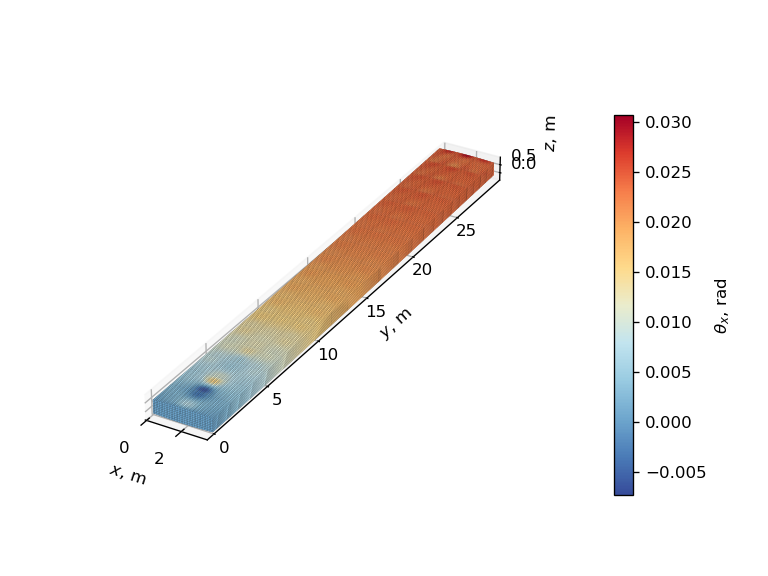

In [35]:
subcase_id = next(iter(sol_106_op2.displacements))
print("Deformation before first snap-through:")
_, ax, cbar = plot_utils.plot_deformation(
    op2=sol_106_op2, subcase_id=subcase_id,
    load_step=increment_instability_indices[0], displacement_component='rx',
    colormap='sunset')
adjust_3d_plot(ax, cbar)
plt.show()

### Nonlinear structural stability optimization <a name="hard-nodes-nonlinear-optimization"></a>

We apply the design load to the linearly optimized structure and run a nonlinear analysis to record the initial values of the constraint and objective functions for the nonlinear structural stability optimization.

In [36]:
# Scale load to design load, change DMAP and run model
sol_106_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = 1.  # scale applied load to frozen aerodynamic load
dmap_stop = sol_106_bdf.executive_control_lines[1].replace(
    "eigenvectors", "eigenvalues_stop")  # get include string for DMAP stopping the analysis after the first negative eigenvalue is found
sol_106_bdf.executive_control_lines[1] = dmap_stop  # change DMAP command to stop the analysis after the first negative eigenvalue is found
input_name = "sol_106_hns_nonlinear_opt_start"
nonlinear_problem.model.nastran_solver.options['input_name'] = input_name
sol_106_bdf.nlpcis[1].mxinc = 200  # decrease maximum number of increments to speed up optimization
nonlinear_problem.run_model()

# Store and print initial KS values and mass
ks_stability_0 = nonlinear_problem["nastran_solver.ks_stability"][0]
ks_stress_0 = nonlinear_problem["nastran_solver.ks_stress"][0]
mass_0 = nonlinear_problem['nastran_solver.mass'][0]
print(f"""Initial KS value for stability: {ks_stability_0:.3f} N/m
Initial KS value for stress: {ks_stress_0:.3e} Pa
Initial mass: {mass_0:.0f} kg""")

Nastran job sol_106_hns_nonlinear_opt_start.bdf completed
Wall time: 2681.0 s
Initial KS value for stability: 0.225 N/m
Initial KS value for stress: -3.322e+08 Pa
Initial mass: 7679 kg


As observed earlier, the initial design for the nonlinear structural stability optimization is unfeasible, given that the structure loses stability before reaching the design load. For this reason we now scale the stability constraint function with the smallest eigenvalue of the first converged increment rather than with the KS value resulting from the overall analysis.

In [37]:
# Set default input values of sol_106 component
nonlinear_problem.model.set_input_defaults(
    'interp.t_cp', linear_opt_thickness_vector)
input_name = "sol_106_hns_nonlinear_opt"
nonlinear_problem.model.options['input_name'] = input_name

# Choose optimizer
nonlinear_problem.driver = om.ScipyOptimizeDriver()
nonlinear_problem.driver.options['optimizer'] = 'COBYLA'
nonlinear_problem.driver.options['tol'] = OPTIMIZER_TOLERANCE

# Add design variable, objective and constraints
nonlinear_problem.model.add_design_var(
    'interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1],
    ref0=thickness_bounds[0], ref=linear_opt_thickness_vector[0])  # scale thickness so that the lower bound is 0 and initial value at root is 1
nonlinear_problem.model.add_objective(
    'nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
nonlinear_problem.model.add_constraint(
    'nastran_solver.ks_stability', upper=0., ref=eigenvalues[0][0])  # scale KS function for nonlinear structural stability so that the initial value is 1
nonlinear_problem.model.add_constraint(
    'nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1
nonlinear_problem.model.add_constraint('nastran_solver.load_factor', lower=.99)  # final applied load should be at least 99% of the design load

We finally add the OpenMDAO recorder and run the optimization.

Requested variables at last iteration:
- interp.t_cp: [0.01555077 0.00442605]
- nastran_solver.ks_stability: [0.311733]
- nastran_solver.ks_stress: [-2.29716448e+08]
- nastran_solver.load_factor: [0.99945444]
- nastran_solver.mass: [8583.2180453]


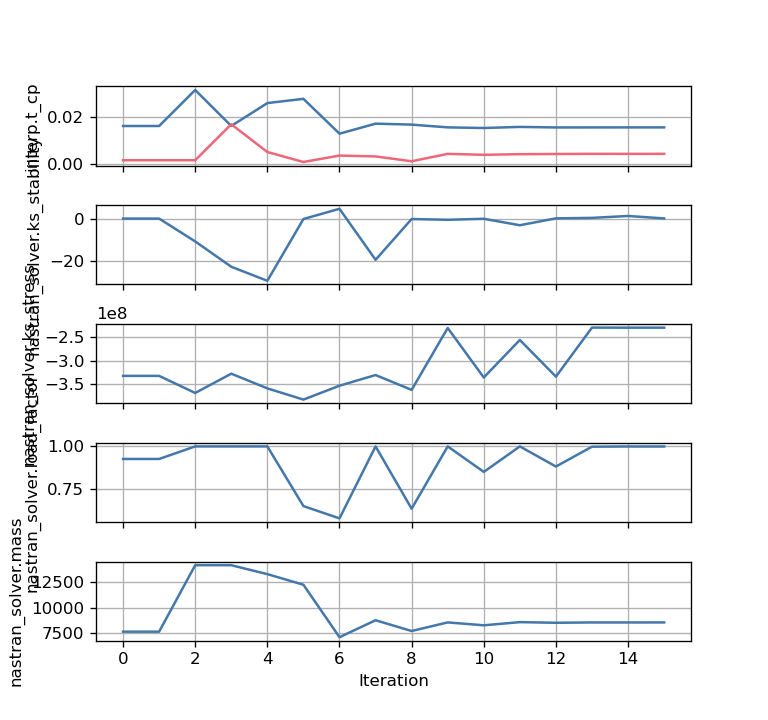

In [38]:
# Add recorder
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
nonlinear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
nonlinear_problem.setup()  # re-setup problem
nonlinear_problem.set_solver_print(0)  # disable solver output
nonlinear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    nonlinear_problem.run_driver()  # run optimization
nonlinear_problem.cleanup()  # clean up problem

# Plot optimization history and print results
_, _, nonlinear_opt_histories = optimization_utils.plot_optimization_history(
    recorder_filepath)  # plot optimization history

The optimization employs about 18.6 hours to complete and ends on an unfeasible design point (positive stability constraint function value). Let's find the last feasible design and print the final values of design variables, constraints and objective.

In [39]:
# Find index of last feasible design
feasible_design_index = np.where(
    nonlinear_opt_histories['nastran_solver.ks_stability'][:, 0] <\
        OPTIMIZER_TOLERANCE)[0][-1]

# Print design variables, constraints and objective at last feasible iteration
print("Design variables, constraints and objective at last feasible iteration:")
for key in nonlinear_opt_histories:
    print(f"- {key}: {nonlinear_opt_histories[key][feasible_design_index]}")

# Find and print mass percentage variation w.r.t. initial structure
mass_percentage_variation = (nonlinear_opt_histories['nastran_solver.mass'][
    feasible_design_index, 0]/mass_0 - 1)*100
print(f"""
Mass variation w.r.t. linearly optimized structure: {mass_percentage_variation:.1f} %""")

Design variables, constraints and objective at last feasible iteration:
- interp.t_cp: [0.01575824 0.00428357]
- nastran_solver.ks_stability: [-2.964985]
- nastran_solver.ks_stress: [-2.55855744e+08]
- nastran_solver.load_factor: [0.99990267]
- nastran_solver.mass: [8611.14099336]

Mass variation w.r.t. linearly optimized structure: 12.1 %


Unlike our last notebook, the nonlinear structural stability optimization does not manage to reduce the mass by decreasing the tip thickness. On the contrary, the nonlinearly optimized structure has a slightly smaller root thickness and substantially larger tip thickness (more than double) compared to the linearly optimized structure, resulting in a total mass increase of approximately 12.1%.

We run the analysis of the last feasible design storing the eigenvectors of the tangent stiffness matrix to inspect the critical instability mode.

In [40]:
# Increase applied load and maximum number of increments
sol_106_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = 2.
sol_106_bdf.nlpcis[1].mxinc = 450

# Get include string for DMAP to store eigenvectors and stop the analysis when
# the first negative eigenvalue is found
dmap_eigenvectors_stop = dmap_eigenvectors.replace(
    "eigenvectors", "eigenvectors_stop")

# Change DMAP command
sol_106_bdf.executive_control_lines[1] = dmap_eigenvectors_stop

# Assign thickness vector of last feasible design
nonlinear_opt_thickness_vector = nonlinear_opt_histories['interp.t_cp'][
    feasible_design_index]
nonlinear_problem.set_val('interp.t_cp', nonlinear_opt_thickness_vector)

# Run analysis of last feasible design
input_name = "sol_106_hns_nonlinear_opt_feasible"
nonlinear_problem.model.nastran_solver.options['input_name'] = input_name
nonlinear_problem.run_model()

Nastran job sol_106_hns_nonlinear_opt_feasible.bdf completed
Wall time: 6915.0 s


Now we plot the eigenvalue diagram and the eigenvector corresponding to the critical instability mode.

c:\Users\qa21944\Github\phd-jupyter-notebooks\notebooks\resources\plot_utils.py:415: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots()


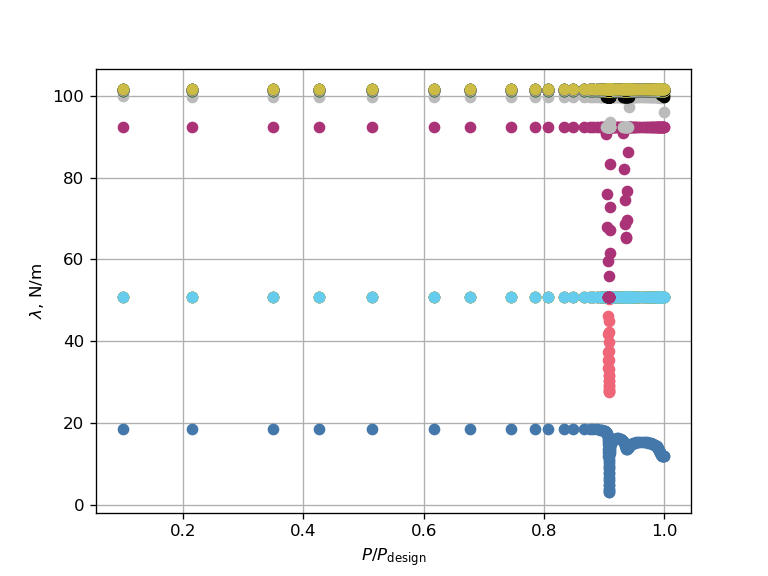

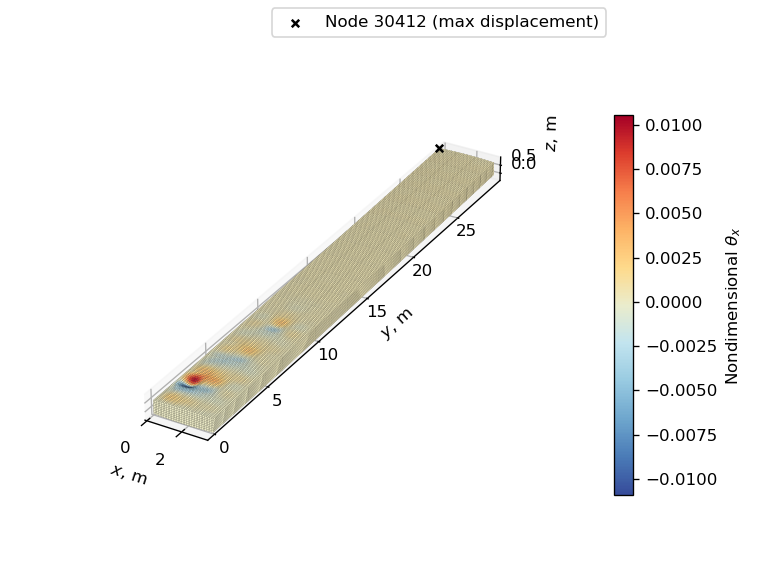

In [41]:
# Read load history
sol_106_op2 = nonlinear_problem['nastran_solver.op2']
load_factors, _, _ = pynastran_utils.read_load_displacement_history_from_op2(
    sol_106_op2)

# Get the id of the subcase
subcase_id = next(iter(load_factors))

# Read eigenvalues of tangent stiffness matrix
eigenvalues = pynastran_utils.read_kllrh_lowest_eigenvalues_from_op2(
    sol_106_op2)

# Plot eigenvalues vs applied load
_, ax = plot_utils.plot_eigenvalue_diagram(
    load_factors[subcase_id], eigenvalues)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

# Get the key of the dictionary containing the eigenvectors
eigenvectors_key = next(iter(sol_106_op2.eigenvectors))

# Plot eigenvector corresponding to lowest eigenvalue of last increment
critical_eigenvector_number = -NO_EIGENVALUES + 1
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_106_op2, subcase_id=eigenvectors_key,
    eigenvector_number=critical_eigenvector_number,
    displacement_component='rx', colormap='sunset',
    displacement_amplification_factor=amplification_factor)

# Plot maximum displacement node
max_displacement_node_id = plot_utils.plot_max_displacement_node(
    axes=ax, op2=sol_106_op2, subcase_id=eigenvectors_key,
    eigenvector_number=critical_eigenvector_number,
    displacement_amplification_factor=amplification_factor)

# Add legend and show plot
ax.legend()
adjust_3d_plot(ax, cbar)
plt.show()

The crititical instability mode appears to be a combination of global bending and local buckling of the second front rib-stiffener panel of the top skin. The global bending is predominant, as the node where the maximum displacement occurs is located at the intersection between the top skin, front spar and tip rib, indicating that presence of a torsional component.

To find the node with the maximum displacement within the second front rib-stiffener panel, we look for the node with the minimum $z$-displacement in the model.

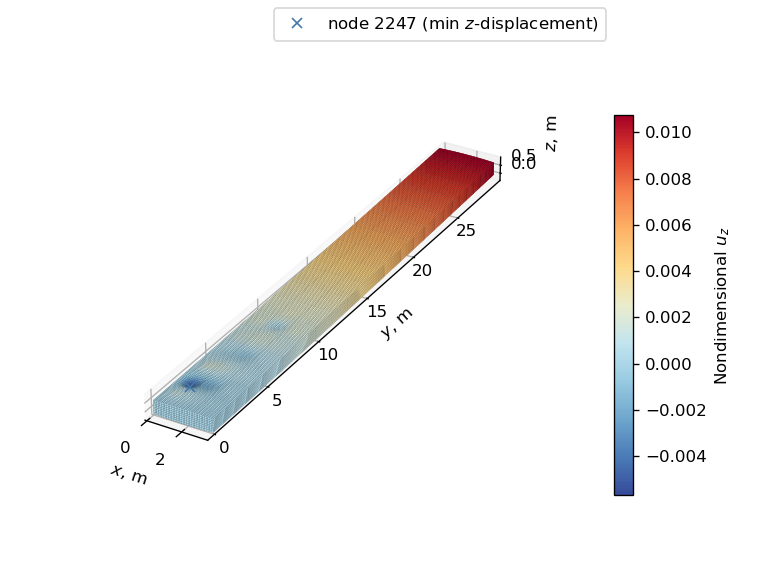

In [42]:
# Plot eigenvector corresponding to lowest eigenvalue of last increment
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_106_op2, subcase_id=eigenvectors_key,
    eigenvector_number=critical_eigenvector_number,
    displacement_component='tz', colormap='sunset',
    displacement_amplification_factor=amplification_factor)

# Find index of minimum z-displacement
min_displacement_index = np.argmin(
    sol_106_op2.eigenvectors[eigenvectors_key].data[
    critical_eigenvector_number - 1, :, 2])
    
# Find node id where minimum z-displacement occurs
min_displacement_node_id = sol_106_op2.eigenvectors[
    eigenvectors_key].node_gridtype[min_displacement_index, 0]

# Find deformed coordinates of the node where minimum z-displacement occurs
min_displacement_node_xyz = sol_106_op2.nodes[min_displacement_index].xyz+\
    + sol_106_op2.eigenvectors[eigenvectors_key].data[
        critical_eigenvector_number - 1, min_displacement_index, 0:3]*\
            amplification_factor
    
# Plot node where minimum z-displacement occurs
ax.plot(min_displacement_node_xyz[0],
        min_displacement_node_xyz[1],
        min_displacement_node_xyz[2],
        'x',
        label=f"node {min_displacement_node_id:d} (min $z$-displacement)",
        zorder=4)

# Add legend and show plot
ax.legend()
adjust_3d_plot(ax, cbar)
plt.show()

Now we run the linear buckling analysis of the nonlinearly optimized structure to find the linear buckling load and the corresponding critical mode shape.

Nastran job sol_105_hns_nonlinear_opt.bdf completed
Wall time: 16.0 s
P_SOL 105/P_design = 0.99
Critical buckling mode:


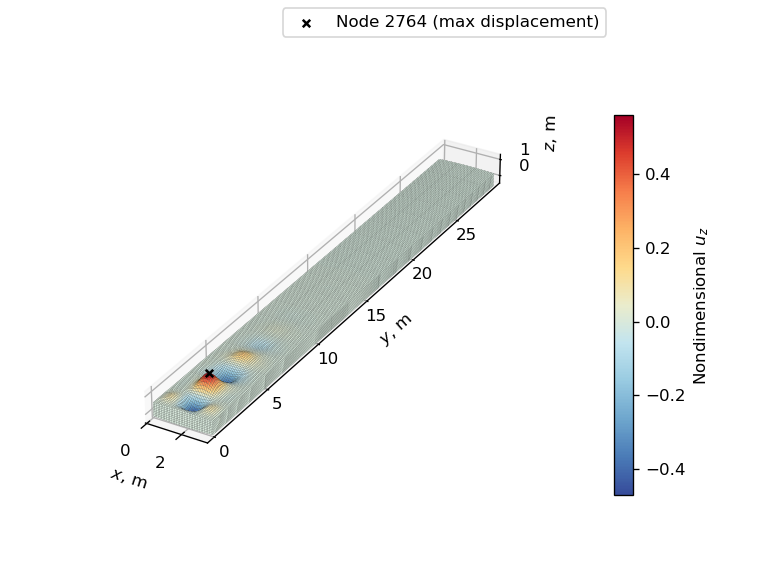

In [43]:
# Create deep copy of base BDF object and set up SOL 105 analysis
sol_105_bdf = base_bdf.__deepcopy__({})
pynastran_utils.set_up_sol_105(
    bdf=sol_105_bdf, static_load_set_id=FORCE_SET_ID,
    method_set_id=METHOD_SET_ID)

# Request stress output
sol_105_bdf.case_control_deck.subcases[0].add_result_type(
    'STRESS', 'ALL', ['PLOT'])

# Apply frozen aerodynamic load obtained from SOL 144
sol_105_hard_nodes_bdf = sol_105_bdf.__deepcopy__({})
pch_filename = "sol_144_hns_linear_opt_feasible.pch"
sol_105_hard_nodes_bdf.add_include_file(pch_filename)

# Create NastranGroup object for linear buckling analysis
input_name = "sol_105_hns_nonlinear_opt"
sol_105_group = optimization_utils.NastranGroup(
        bdf=sol_105_hard_nodes_bdf, input_name=input_name, 
        analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
        run_flag=False, yield_strength=SIGMA_Y)

# Add thickness spline component and connect it to the NastranSolver component
sol_105_group.add_subsystem('interp', thickness_interp_comp)
sol_105_group.connect('interp.t_val', 'nastran_solver.t_val')

# Set up nonlinear OpenMDAO problem
linear_buckling_problem = om.Problem(
        model=sol_105_group, name="hard_nodes_linear_buckling")
linear_buckling_problem.setup()

# Assign initial thickness distribution and run model
linear_buckling_problem.set_val('interp.t_cp', nonlinear_opt_thickness_vector)  # assign thickness array to spline component input
linear_buckling_problem.run_model()  # run analysis

# Retrieve OP2 object of nonlinear analysis and print buckling load
sol_105_op2 = linear_buckling_problem['nastran_solver.op2']  # get OP2 object from the problem
nonlinear_opt_blf = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigrs[0]
print(f"P_SOL 105/P_design = {nonlinear_opt_blf:.2f}")

# Plot buckling mode
print("Critical buckling mode:")
amplification_factor = 1.5  # amplification factor for displacements
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz',
    colormap='sunset', displacement_amplification_factor=amplification_factor)

# Plot maximum displacement node and add legend
max_displacement_node_id = plot_utils.plot_max_displacement_node(
    axes=ax, op2=sol_105_op2,
    displacement_amplification_factor=amplification_factor)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

The linear buckling load is approximately 0.99 times the design load, meaning that the linear buckling analysis is slightly conservative. The critical mode shape is characterized by a local buckling over the root rib-stiffener panels of the top skin, with the maximum displacement occurring in the second central panel from the root.

We now plot the load-displacement diagram, considering the minimum $z$-displacement node of the nonlinear critical instability mode, the maximum displacment node of the linear critical buckling mode, and the tip displacement.

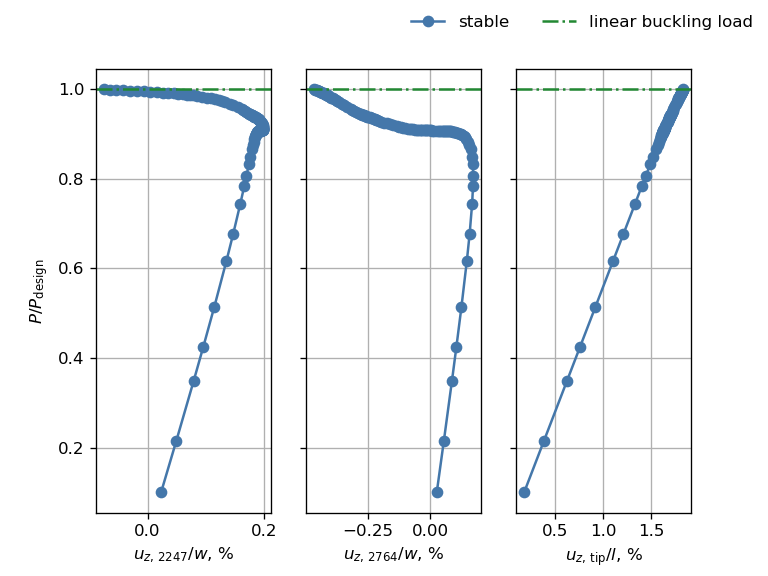

In [44]:
# Read displacements history from OP2 object
plot_nodes_ids = [min_displacement_node_id, max_displacement_node_id,
                  tip_node_id]
_, _, displacements = pynastran_utils.read_load_displacement_history_from_op2(
        op2=sol_106_op2, node_ids=plot_nodes_ids)

# List with labels of the displacements
displacement_labels = [f"{min_displacement_node_id:d}",
                       f"{max_displacement_node_id:d}", "tip"]
# List with reference lengths of the displacements
reference_lengths = [W, W, L]
# List with labels of the reference lengths
reference_lengths_labels = ["w", "w", "l"]

# Create figure with two subplots
fig, axes = plt.subplots(1, 3, sharey=True)

# Loop over the subplots
for i, label in enumerate(displacement_labels):
    nondimensional_disp = displacements[plot_nodes_ids[i]][subcase_id][
        :, Z_COMPONENT_INDEX]/reference_lengths[i]*100
    plot_utils.plot_2d_load_displacements_stability(  # plot load-displacement curve highlighting stable and unstable segments
            axes[i],
            nondimensional_disp,
            load_factors[subcase_id],
            eigenvalues,
            MARKERS[0],
            COLORS[0])
    axes[i].axhline(y=1., color=GLASS_CEILING_COLOR, linestyle='-.')      # plot glass ceiling line
    axes[i].set_xlabel(
        f"$u_{{z,\,\mathrm{{{label}}}}}/{reference_lengths_labels[i]}$, %")  # set x-axis label
    axes[i].grid(visible=True)  # enable grid
axes[0].set_ylabel("$P/P_\mathrm{design}$")  # set y-axis label

# Add legend and show plot
fig.legend(handles=[stable_line, glass_ceiling_line], frameon=False, ncol=2)
plt.show()

Comparing the load-displacement diagram of node 2764 with that obtained for the linearly optimized structure, we can see that the instabilities that characterized the linearly optimized structure where the displacement of this node starts decreasing sharply are not present in the nonlinearly optimized structure. As far as node 2247 is concerned, we observe a sudden and short-lived increase of the displacement in correspondence of the sharp decrease of the displacement of node 2764, followed by a decrease until the end of the analysis. The trend of the displacement of node 2247 hints at the fact that the optimizer has placed the load limit point corresponding to the critical nonlinear mode visulized earlier just above the design load.

Finally we plot the deformation of the nonlinearly optimized structure at the design load.

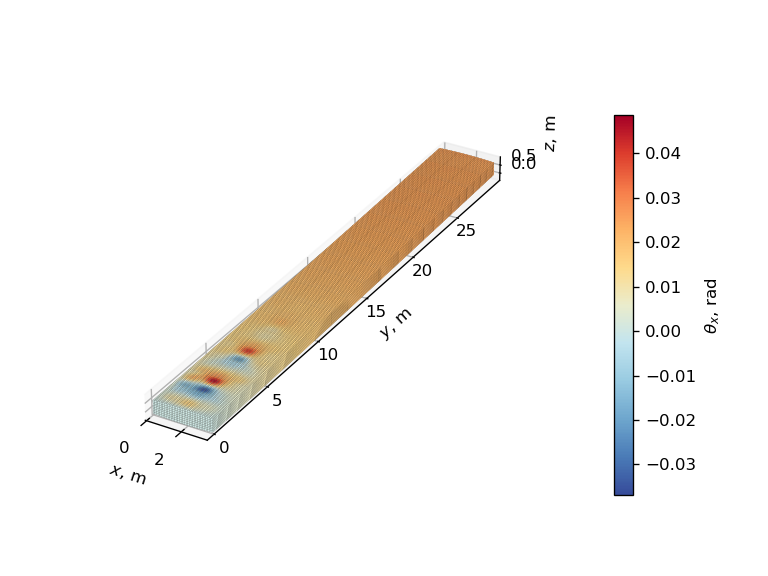

In [45]:
_, ax, cbar = plot_utils.plot_deformation(
    op2=sol_106_op2, subcase_id=subcase_id, displacement_component='rx',
    colormap='sunset')
adjust_3d_plot(ax, cbar)
plt.show()

The deformation is characterized by peak rotations in the second central rib-stiffener panel of the top skin, however this time we can see that also the front rib-stiffener panel experiences a significant rotation, even if to a lesser extent.

## Aeroelastic coupling via load reference axis <a name="lra"></a>

***

In [46]:
def define_load_reference_axis(bdf, struct_mesh):
    # Find last node id and intialize array of spline nodes ids
    last_node_id = len(bdf.nodes)
    spline_nodes_ids = np.arange(
        last_node_id + 1, last_node_id + 3*(len(RIBS_Y_LOCATIONS) - 1) + 1)
    
    # Find indices of the nodes at the intersection of ribs and skin
    intersection_nodes_indices = np.flatnonzero(
            ((np.char.find(struct_mesh.point_data['tags'], "rib") != -1) &
            (np.char.find(struct_mesh.point_data['tags'], "skin") != -1)))
    
    # Find coordinates of all nodes
    nodes_xyz_array = struct_mesh.points
    
    # Loop over the y-coordinates of the ribs except for the first rib, which
    # is constrained by the SPC1 card
    te_node_id = last_node_id  # initialize trailing edge node id
    for y in RIBS_Y_LOCATIONS[1:]:
        # Add node at quarter chord
        c_4_node_id = te_node_id + 1
        bdf.add_grid(c_4_node_id, np.array([C_4_X, y, 0]))
        
        # Find id of the skin nodes intersecting current rib
        skin_nodes_indices = intersection_nodes_indices[np.abs(nodes_xyz_array[
            intersection_nodes_indices, 1] - y) < NODE_TOLERANCE]
        skin_nodes_ids = skin_nodes_indices + 1
        
        # Add RBE3 element to connect quarter chord node with skin nodes
        rbe3_eid = len(bdf.elements) + len(bdf.rigid_elements) + 1
        bdf.add_rbe3(
            eid=rbe3_eid, refgrid=c_4_node_id, refc='123456', weights=[1.],
            comps=['123456'], Gijs=[skin_nodes_ids.tolist()])
        
        # Add nodes at wing leading and trailing edge
        le_node_id = c_4_node_id + 1
        bdf.add_grid(le_node_id, np.array([LE_X, y, 0]))
        te_node_id = le_node_id + 1
        bdf.add_grid(te_node_id, np.array([TE_X, y, 0]))
        
        # Add RBE2 element to connect leading and trailing edge node with
        # quarter chord node
        rbe2_eid = len(bdf.elements) + len(bdf.rigid_elements) + 1
        bdf.add_rbe2(rbe2_eid, c_4_node_id, '123456', [le_node_id, te_node_id])
        
    # Return spline nodes ids
    return spline_nodes_ids

# Function to define spline data with hard nodes approach
def define_load_reference_axis_spline(
    bdf, set1_id, spline_nodes_ids, caero_id, nspan, nchord, usage="BOTH"):
        # Add SET1 card to the BDF file to define the set of nodes for spline
    # interpolation
    bdf.add_set1(sid=set1_id, ids=spline_nodes_ids)
    
    # Add SPLINE1 card to the BDF file to define the spline interpolation
    spline1_eid = int(10**np.ceil(np.log10(caero_id)) + 1)  # spline element id
    box2 = caero_id + nspan*nchord - 1  # id of last aerodynamic box
    bdf.add_spline1(
        eid=spline1_eid, caero=caero_id, box1=caero_id, box2=box2,
        setg=set1_id, dz=CHORD*L/4, usage=usage)

### Analysis of initial structure <a name="lra-initial"></a>

#### Linear buckling <a name="lra-initial-linear-buckling"></a>

Nastran job sol_144_lra_initial.bdf completed
Wall time: 11.0 s


subcase=1 already exists...skipping


Nastran job sol_105_sol_144_lra_initial.bdf completed
Wall time: 15.0 s
Buckling load factor: 1.01
Total normal force corresponding to buckling load: 249145 N
Buckling mode:


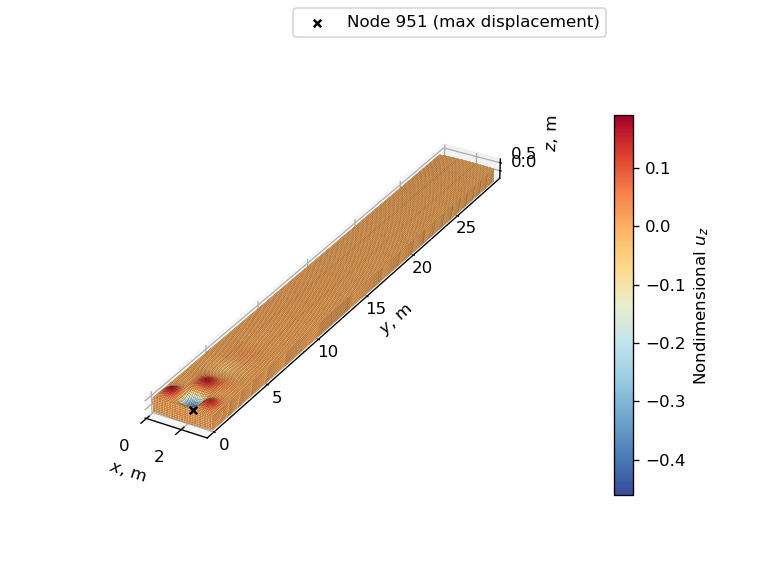

In [47]:
# Create a deepy copy of the base BDF object and define hard nodes spline
lra_spline_bdf = sol_144_bdf.__deepcopy__({})
spline_nodes_ids = define_load_reference_axis(lra_spline_bdf, struct_mesh)
define_load_reference_axis_spline(
    lra_spline_bdf, set1_sid, spline_nodes_ids, caero_id, nspan_converged_mesh,
    nchord_converged_mesh)

# Define NastranGroup object with dummy BDF and input name
input_name = "sol_144_lra_initial"
sol_144_group = optimization_utils.NastranGroup(
        bdf=lra_spline_bdf, analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
        input_name=input_name, run_flag=False, yield_strength=SIGMA_Y)

# Add thickness spline component to NastranGroup and connect it to the
# NastranSolver component
sol_144_group.add_subsystem('interp', thickness_interp_comp)
sol_144_group.connect('interp.t_val', 'nastran_solver.t_val')

# Set up linear OpenMDAO problem
linear_aeroelastic_problem = om.Problem(model=sol_144_group, name="lra_linear_aeroelastic")
linear_aeroelastic_problem.setup()

#  Assign initial thickness and run model
initial_thickness_vector = t0*np.ones(2)  # constant initial thickness
linear_aeroelastic_problem.set_val('interp.t_cp', initial_thickness_vector)  # assign initial thickness vector to input of spline component
linear_aeroelastic_problem.run_model()  # run the model

# Get OP2 object from problem and print buckling load factor
sol_105_op2 = linear_aeroelastic_problem['nastran_solver.op2']
buckling_load_factor = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigr
print(f"Buckling load factor: {buckling_load_factor:.2f}")

# Find and print corresponding value of total normal force
buckling_normal_force = sol_105_op2.load_vectors[FIRST_SUBCASE_ID].data[
    :, :, Z_COMPONENT_INDEX].sum()*buckling_load_factor
print(f"""Total normal force corresponding to buckling load: {buckling_normal_force:.0f} N""")

# Plot critical buckling mode
print("Buckling mode:")
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz',
    colormap='sunset', displacement_amplification_factor=amplification_factor)
root_node_id = plot_utils.plot_max_displacement_node(
    axes=ax, op2=sol_105_op2,
    displacement_amplification_factor=amplification_factor)
ax.legend()
adjust_3d_plot(ax, cbar)
plt.show()

#### Nonlinear analysis <a name="lra-initial-nonlinear-analysis"></a>

In [48]:
# Setup SOL 106 with arc-length method
sol_106_bdf = base_bdf.__deepcopy__({})
pynastran_utils.set_up_arc_length_method(
        bdf=sol_106_bdf, max_iter=3, conv='PU', eps_u=5e-6, eps_p=5e-6,
        max_bisect=20, minalr=1e-5, desiter=4, maxinc=450)

# Define load reference axis
define_load_reference_axis(sol_106_bdf, struct_mesh)

# Apply frozen aerodynamic load obtained from SOL 144
input_name = "sol_144_lra_initial"
pch_filepath = input_name + '.pch'
sol_106_bdf.add_include_file(pch_filepath)

# Create load case with frozen aerodynamic load scaled to twice the linear
# buckling load
scale_factor = buckling_load_factor*2
sol_106_bdf.add_load(
    sid=LOAD_SET_ID, scale=1., scale_factors=[scale_factor],
    load_ids=[FORCE_SET_ID])
pynastran_utils.create_static_load_subcase(
        bdf=sol_106_bdf, subcase_id=FIRST_SUBCASE_ID, load_set_id=LOAD_SET_ID)

# Set up nonlinear analysis with calculation of tangent stiffness matrix
# eigenvalues
pynastran_utils.set_up_sol_106_with_kllrh_eigenvalues(
        bdf=sol_106_bdf, analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
        method_set_id=METHOD_SET_ID, no_eigenvalues=NO_EIGENVALUES,
        upper_eig=UPPER_EIGENVALUE)

# Request nonlinear stress results of all elements in the op2 file
sol_106_bdf.case_control_deck.subcases[0].add_result_type(
        'NLSTRESS', 'ALL', ['PLOT'])

# Create NastranGroup object
input_name = "sol_106_lra_initial"
sol_106_group = optimization_utils.NastranGroup(
        bdf=sol_106_bdf, analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
        input_name=input_name, run_flag=False, yield_strength=SIGMA_Y)

# Add thickness spline component and connect it to the NastranSolver component
sol_106_group.add_subsystem('interp', thickness_interp_comp)
sol_106_group.connect('interp.t_val', 'nastran_solver.t_val')

# Set up nonlinear OpenMDAO problem
nonlinear_problem = om.Problem(
        model=sol_106_group, name="lra_nonlinear")
nonlinear_problem.setup()

# Assign initial thickness distribution and run model
nonlinear_problem.set_val('interp.t_cp', initial_thickness_vector)
nonlinear_problem.run_model()  # run analysis

Nastran job sol_106_lra_initial.bdf completed
Wall time: 15368.0 s


We plot the eigenvalue diagram.

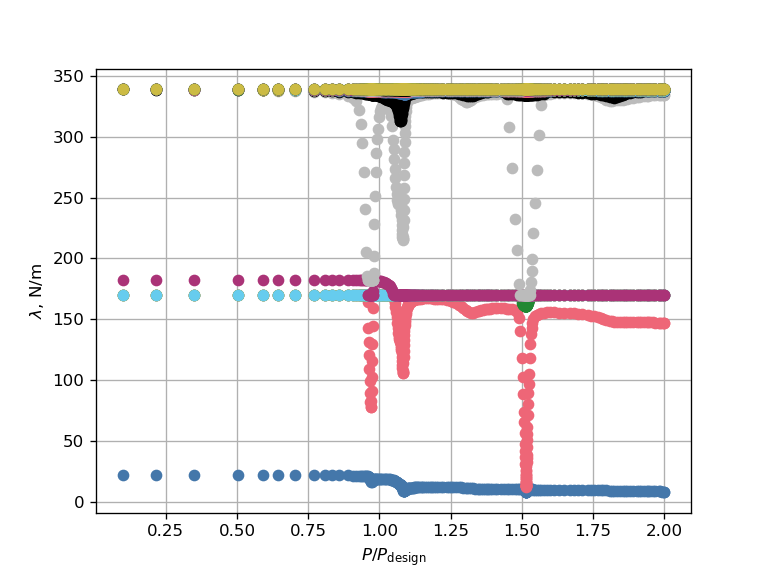

In [49]:
# Retrieve OP2 object
sol_106_op2 = nonlinear_problem['nastran_solver.op2']  # get OP2 object from the problem

# Read load and displacment histories from OP2 object
plot_nodes_ids = [root_node_id, tip_node_id]  # list of node ids where displacement is monitored
load_factors, _, displacements =\
    pynastran_utils.read_load_displacement_history_from_op2(
        op2=sol_106_op2, node_ids=plot_nodes_ids)
nondimensional_loads = load_factors[FIRST_SUBCASE_ID]*2  # load factor goes from 0 to 1, nondimensional load goes to 0 to 2 (applied load is nondimensionalized with linear buckling load)

# Read eigenvalues from f06 file
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path of f06 file
eigenvalues = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)  # read eigenvalues from f06 file

# Plot eigenvalues vs applied load
_, ax = plot_utils.plot_eigenvalue_diagram(nondimensional_loads, eigenvalues)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
plt.show()

No negative eigenvalues are present in the eigenvalue diagram, indicating that no instability is present within the investigated load range.

Succesively we visualize the load-displacement diagram.

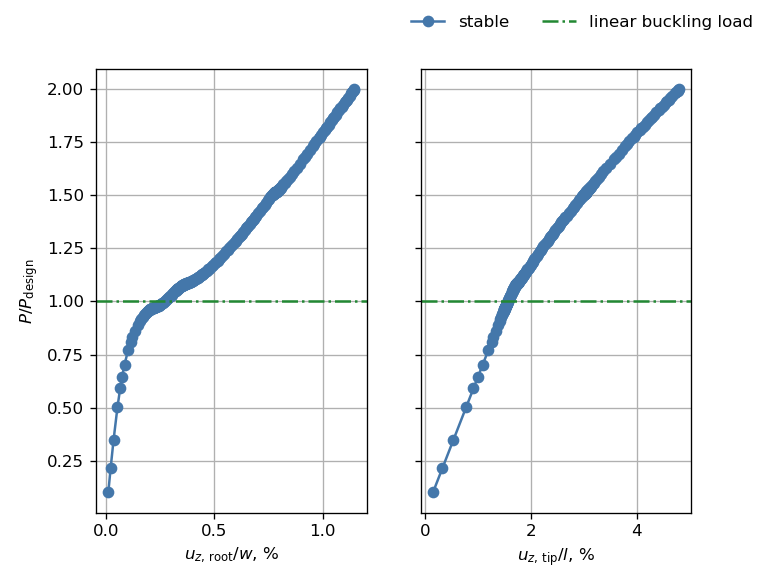

In [50]:
# Create lists of reference lengths and labels for the load-displacement plots
displacement_labels = ["root", "tip"]  # labels for the displacements
reference_lengths = [W, L]  # reference lengths for the displacements
reference_lengths_labels = ["w", "l"]  # reference labels for the displacements

# Create figure with two subplots
fig, axes = plt.subplots(1, 2, sharey=True)

# Loop over the subplots
for i, label in enumerate(displacement_labels):
    nondimensional_disp = displacements[plot_nodes_ids[i]][FIRST_SUBCASE_ID][
        :, Z_COMPONENT_INDEX]/reference_lengths[i]*100
    plot_utils.plot_2d_load_displacements_stability(  # plot load-displacement curve highlighting stable and unstable segments
            axes[i],
            nondimensional_disp,
            nondimensional_loads,
            eigenvalues,
            MARKERS[0],
            COLORS[0])
    axes[i].axhline(y=1., color=GLASS_CEILING_COLOR, linestyle='-.')      # plot glass ceiling line
    axes[i].set_xlabel(
        f"$u_{{z,\,\mathrm{{{label}}}}}/{reference_lengths_labels[i]}$, %")  # set x-axis label
    axes[i].grid(visible=True)  # enable grid
axes[0].set_ylabel("$P/P_\mathrm{design}$")  # set y-axis label

# Add legend and show plot
fig.legend(
    handles=[stable_line, glass_ceiling_line], frameon=False, ncol=2)  # add legend
plt.show()

Plot the deformation at the design load.

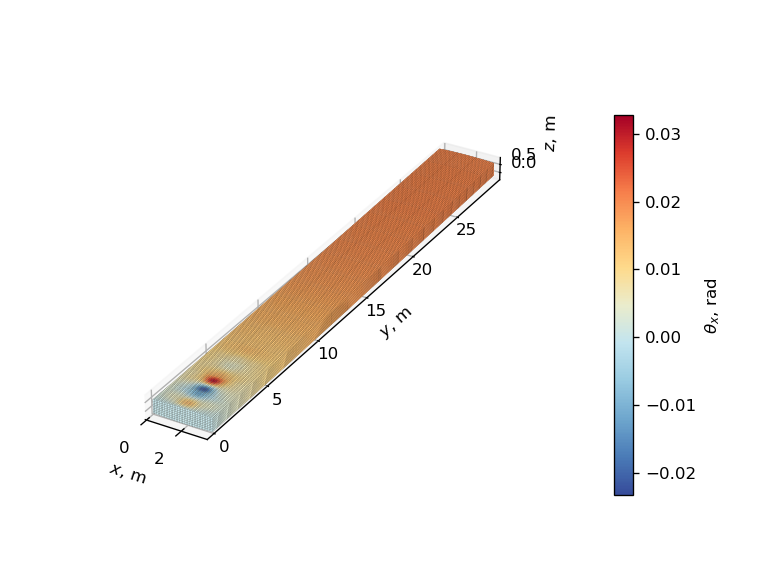

In [51]:
# Find index corresponding to design load
design_load_index = np.argmin(np.abs(nondimensional_loads - 1.))

# Plot deformation
_, ax, cbar = plot_utils.plot_deformation(
    op2=sol_106_op2, load_step=design_load_index + 1,
    displacement_component='rx', colormap='sunset')
adjust_3d_plot(ax, cbar)
plt.show()

### Linear buckling optimization <a name="lra-linear-optimization"></a>

We store and print initial values of objective and constraint functions.

In [52]:
mass_0 = linear_aeroelastic_problem['nastran_solver.mass'][0]
ks_buckling_0 = linear_aeroelastic_problem['nastran_solver.ks_buckling'][0]
ks_stress_0 = linear_aeroelastic_problem['nastran_solver.ks_stress'][0]
print(f"""Initial KS value for buckling load factor: {ks_buckling_0:.3f}
Initial KS value for stress: {ks_stress_0:.3e} Pa
Initial mass: {mass_0:.0f} kg""")

Initial KS value for buckling load factor: -0.014
Initial KS value for stress: -3.232e+08 Pa
Initial mass: 26467 kg


We set up the optimization, run it, and plot the optimization history.

Requested variables at last iteration:
- interp.t_cp: [0.01642411 0.00176202]
- nastran_solver.ks_buckling: [0.02131325]
- nastran_solver.ks_stress: [-3.23173376e+08]
- nastran_solver.mass: [15627.66085422]


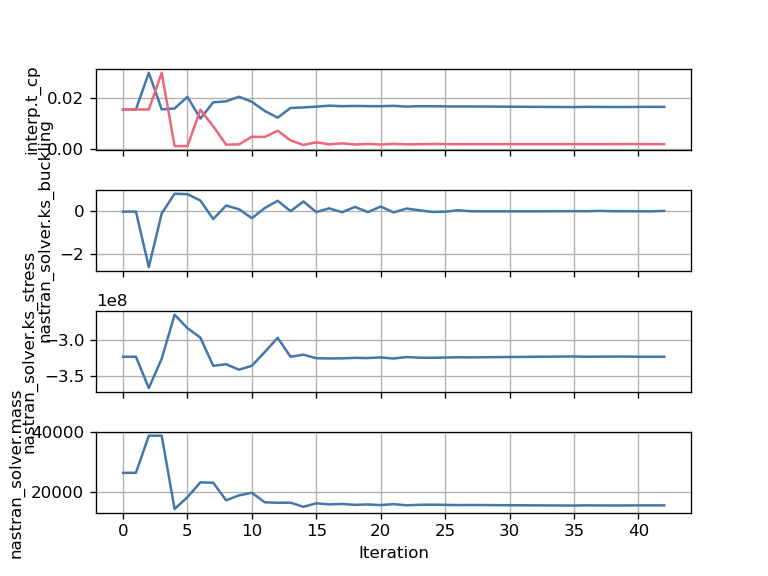

In [53]:
# Change default name of input file
input_name = "sol_144_lra_linear_opt"
linear_aeroelastic_problem.model.options['input_name'] = input_name

# Set initial thickness vector for optimization
linear_aeroelastic_problem.model.set_input_defaults(
    'interp.t_cp', initial_thickness_vector)

# Choose optimizer
linear_aeroelastic_problem.driver = om.ScipyOptimizeDriver()
linear_aeroelastic_problem.driver.options['optimizer'] = 'COBYLA'
linear_aeroelastic_problem.driver.options['tol'] = OPTIMIZER_TOLERANCE

# Add design variable, objective and constraints
linear_aeroelastic_problem.model.add_design_var(
    'interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1],
    ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
linear_aeroelastic_problem.model.add_objective(
    'nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
linear_aeroelastic_problem.model.add_constraint('nastran_solver.ks_buckling', upper=0.)  # KS function for buckling load factor is not scaled because buckling load factor is already a ratio
linear_aeroelastic_problem.model.add_constraint(
    'nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1

# Add recorder to the driver
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
linear_aeroelastic_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
linear_aeroelastic_problem.setup()  # re-setup problem before running optimization
linear_aeroelastic_problem.set_solver_print(0)  # disable solver output
linear_aeroelastic_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    linear_aeroelastic_problem.run_driver()  # run optimization
linear_aeroelastic_problem.cleanup()  # clean up problem

# Plot optimization history and print results
_, _, linear_opt_histories = optimization_utils.plot_optimization_history(
    recorder_filepath)  # plot optimization history

The optimization does not end on a feasible design point (the buckling constraint function is larger than $10^{-3}$). For this reason we take as final design point the one with the buckling constraint function smaller than $10^{-3}$.

In [54]:
# Find index of last feasible design
feasible_design_index = np.where(
    linear_opt_histories['nastran_solver.ks_buckling'][:, 0] <\
        OPTIMIZER_TOLERANCE)[0][-1]

# Print design variables, constraints and objective at last feasible iteration
print("Design variables, constraints and objective at last feasible iteration:")
for key in linear_opt_histories:
    print(f"- {key}: {linear_opt_histories[key][feasible_design_index]}")

# Find and print mass percentage variation w.r.t. initial structure
mass_percentage_variation = (linear_opt_histories['nastran_solver.mass'][
    feasible_design_index, 0]/mass_0 - 1)*100
print(f"""
Mass variation w.r.t. initial structure: {mass_percentage_variation:.1f} %""")

Design variables, constraints and objective at last feasible iteration:
- interp.t_cp: [0.01641843 0.00177526]
- nastran_solver.ks_buckling: [1.07288361e-06]
- nastran_solver.ks_stress: [-3.23185792e+08]
- nastran_solver.mass: [15634.15725548]

Mass variation w.r.t. initial structure: -40.9 %


We run the analysis of the last feasible design and plot the critical buckling mode of the optimized structure.

Nastran job sol_144_lra_linear_opt_feasible.bdf completed
Wall time: 11.0 s


subcase=1 already exists...skipping


Nastran job sol_105_sol_144_lra_linear_opt_feasible.bdf completed
Wall time: 14.0 s


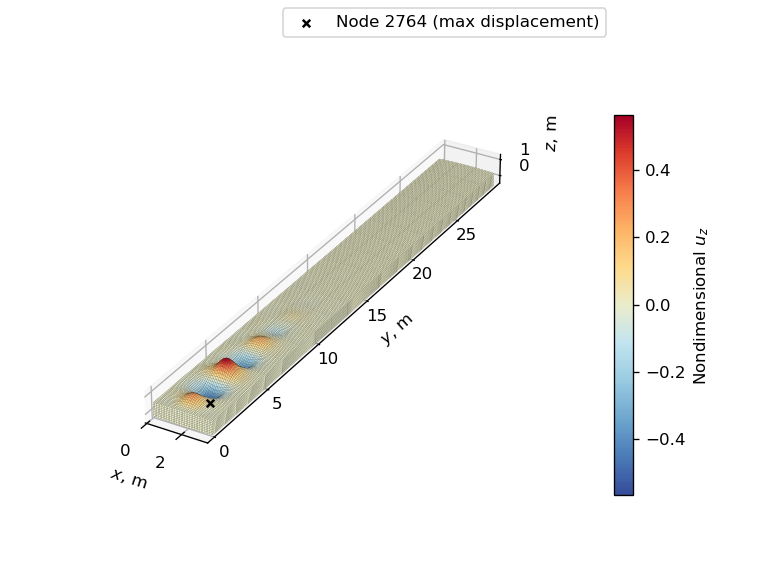

In [55]:
# Run analysis of last feasible design
linear_opt_thickness_vector = linear_opt_histories['interp.t_cp'][
    feasible_design_index]
linear_aeroelastic_problem.set_val('interp.t_cp', linear_opt_thickness_vector)
input_name = "sol_144_lra_linear_opt_feasible"
linear_aeroelastic_problem.model.nastran_solver.options['input_name'] = input_name
linear_aeroelastic_problem.run_model()

# Get OP2 object and plot critical buckling mode
sol_105_op2 = linear_aeroelastic_problem['nastran_solver.op2']
amplification_factor = 1.5
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz',
    colormap='sunset',
    displacement_amplification_factor=amplification_factor)
max_disp_node_id = plot_utils.plot_max_displacement_node(
        axes=ax, op2=sol_105_op2,
        displacement_amplification_factor=amplification_factor)
ax.legend()
adjust_3d_plot(ax, cbar)
plt.show()

In [56]:
total_normal_force = sol_105_op2.load_vectors[FIRST_SUBCASE_ID].data[
    :, :, Z_COMPONENT_INDEX].sum()
print(f"""Total normal force applied to linearly optimized structure: {total_normal_force:.0f} N""")

Total normal force applied to linearly optimized structure: 253034 N


Now we run the nonlinear analysis of the linearly optimized structure.

In [57]:
# Change punch file of frozen aerodynamic load
sol_106_bdf.reject_lines[0][0] = f"INCLUDE '{input_name}.pch'"

# Scale applied load to twice the frozen aerodynamic load
sol_106_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = 2.

# Change default name of input file
input_name = "sol_106_lra_linear_opt"
nonlinear_problem.model.options['input_name'] = input_name

# Assign linearly optimized thickness vector and run model
nonlinear_problem.setup()
nonlinear_problem.set_val('interp.t_cp', linear_opt_thickness_vector)
nonlinear_problem.run_model()

Nastran job sol_106_lra_linear_opt.bdf completed
Wall time: 56691.0 s


Plot eigenvalue diagram.

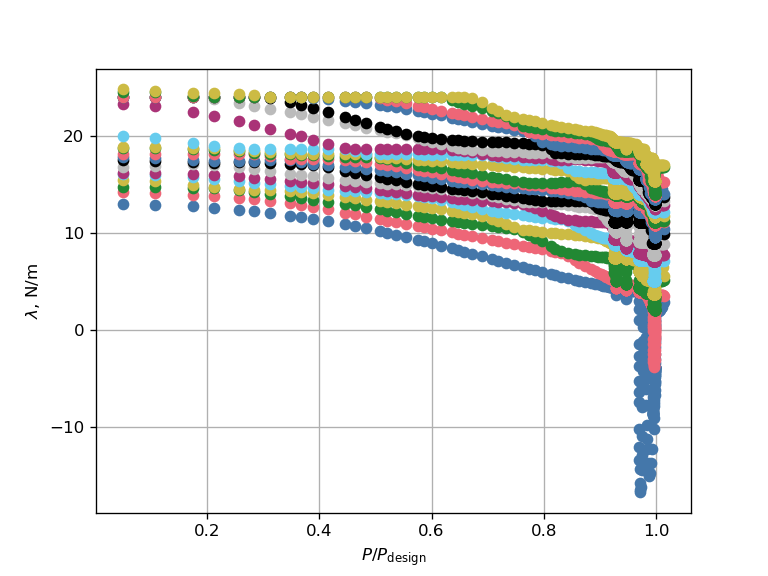

In [58]:
# Read displacements, loads and eigenvalues
sol_106_op2 = nonlinear_problem['nastran_solver.op2']  # get OP2 object from the problem
plot_nodes_ids = [root_node_id, max_disp_node_id, tip_node_id]  # list of node ids to plot
load_factors, _, displacements =\
    pynastran_utils.read_load_displacement_history_from_op2(
        op2=sol_106_op2, node_ids=plot_nodes_ids)  # read applied loads from OP2 object
nondimensional_loads = load_factors[FIRST_SUBCASE_ID]*2
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path of f06 file
eigenvalues = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)  # read eigenvalues from f06 file

# Plot eigenvalues vs applied load
_, ax = plot_utils.plot_eigenvalue_diagram(nondimensional_loads, eigenvalues)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

Plot eigenvalues against the cumulative sum of the absolute value of the arc-length increments.

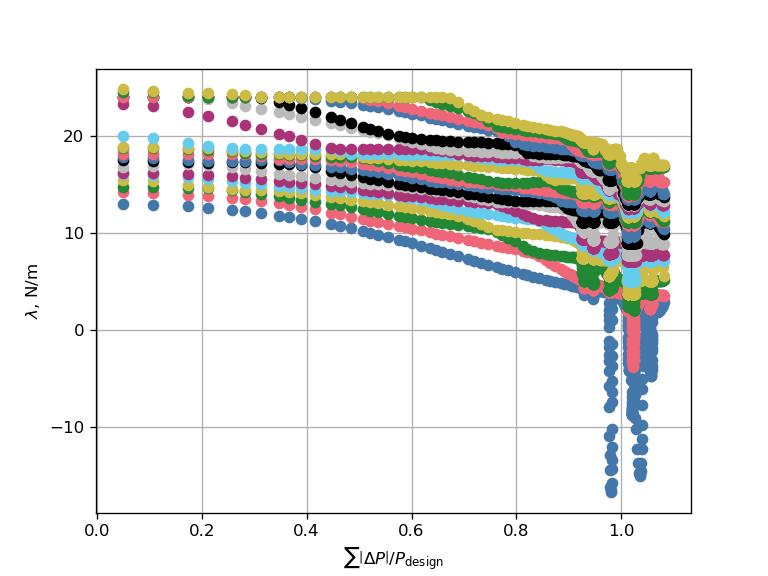

In [59]:
_, ax = plt.subplots()
cumsum_nondimensional_loads = np.cumsum(
    np.abs(np.diff(np.insert(nondimensional_loads[:-1], 0, 0.))))  # cumulative sum of load increments
ax.plot(cumsum_nondimensional_loads, eigenvalues.T, 'o')  # convert eigenvalues from N/mm to N/m
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel(r"$\sum \left|\Delta P\right|/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

Plot load-displacement diagram.

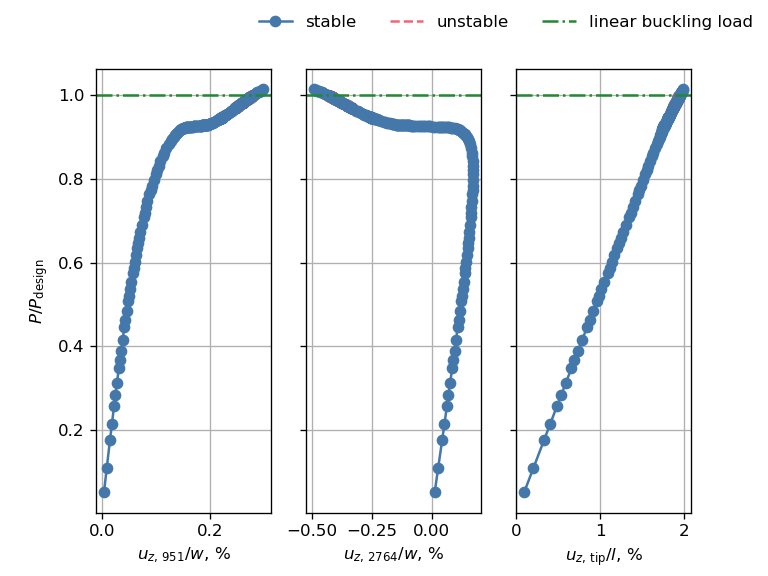

In [60]:
# Create lists of reference lengths and labels for the load-displacement plots
displacement_labels = [
    f"{plot_nodes_ids[0]:d}", f"{plot_nodes_ids[1]:d}", "tip"]  # labels for the displacements
reference_lengths = [W, W, L]  # reference lengths for the displacements
reference_lengths_labels = ["w", "w", "l"]  # reference labels for the displacements

# Create figure with two subplots
fig, axes = plt.subplots(1, 3, sharey=True)

# Loop over the subplots
for i, label in enumerate(displacement_labels):
    nondimensional_disp = displacements[plot_nodes_ids[i]][FIRST_SUBCASE_ID][
        :, Z_COMPONENT_INDEX]/reference_lengths[i]*100
    plot_utils.plot_2d_load_displacements_stability(  # plot load-displacement curve highlighting stable and unstable segments
            axes[i],
            nondimensional_disp,
            nondimensional_loads,
            eigenvalues,
            MARKERS[0],
            COLORS[0])
    axes[i].axhline(y=1., color=GLASS_CEILING_COLOR, linestyle='-.')      # plot glass ceiling line
    axes[i].set_xlabel(
        f"$u_{{z,\,\mathrm{{{label}}}}}/{reference_lengths_labels[i]}$, %")  # set x-axis label
    axes[i].grid(visible=True)  # enable grid
axes[0].set_ylabel("$P/P_\mathrm{design}$")  # set y-axis label

# Add legend and show plot
fig.legend(handles=[stable_line, unstable_line, glass_ceiling_line],
           frameon=False, ncol=3)  # add legend
plt.show()

Reanalyze the structure storing the eigenvectors of the tangent stiffness matrix.

In [61]:
# Change dmap command
sol_106_bdf.executive_control_lines[1] = dmap_eigenvectors

# Change name of input file
input_name = "sol_106_lra_linear_opt_eigenvectors"
nonlinear_problem.model.nastran_solver.options['input_name'] = input_name

# Run model
nonlinear_problem.run_model()

Nastran job sol_106_lra_linear_opt_eigenvectors.bdf completed
Wall time: 56821.0 s


Plot the eigenvectors corresponding to the negative eigenvalues of the first four instabilities.

Eigenvector of instability 1, P/P_design=0.98:


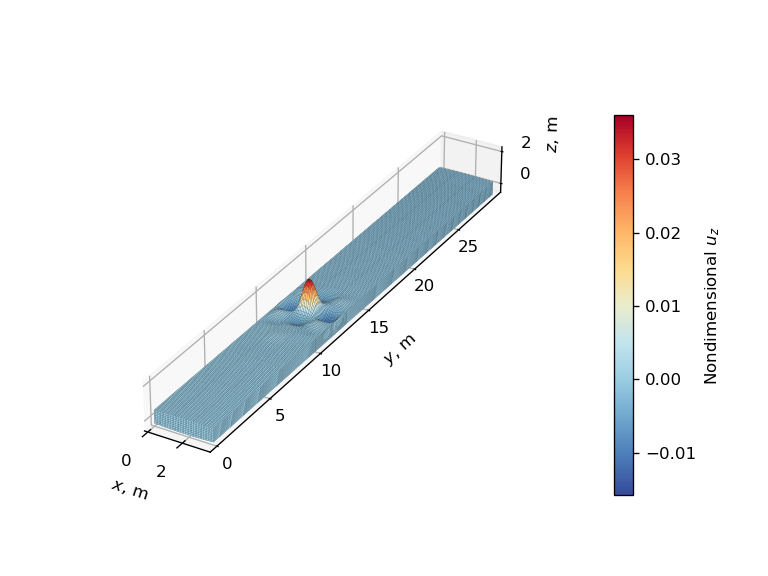

Eigenvector of instability 2, P/P_design=1.00:


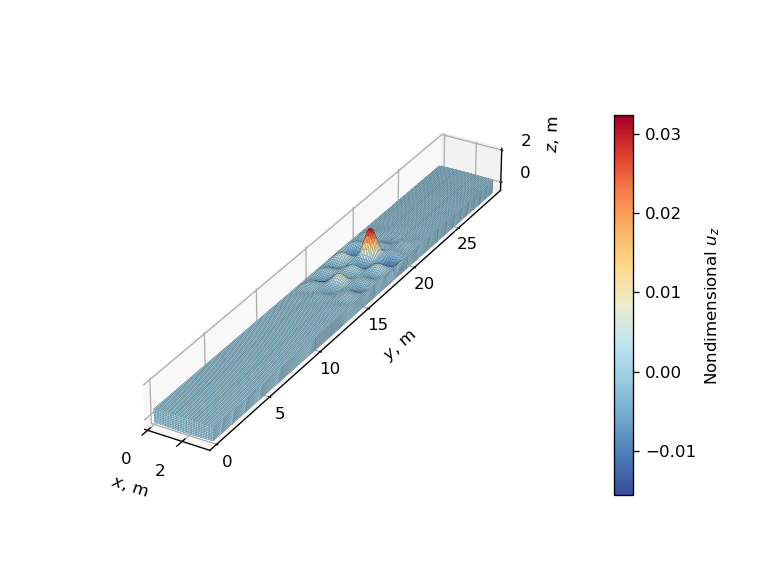

Eigenvector of instability 3, P/P_design=1.00:


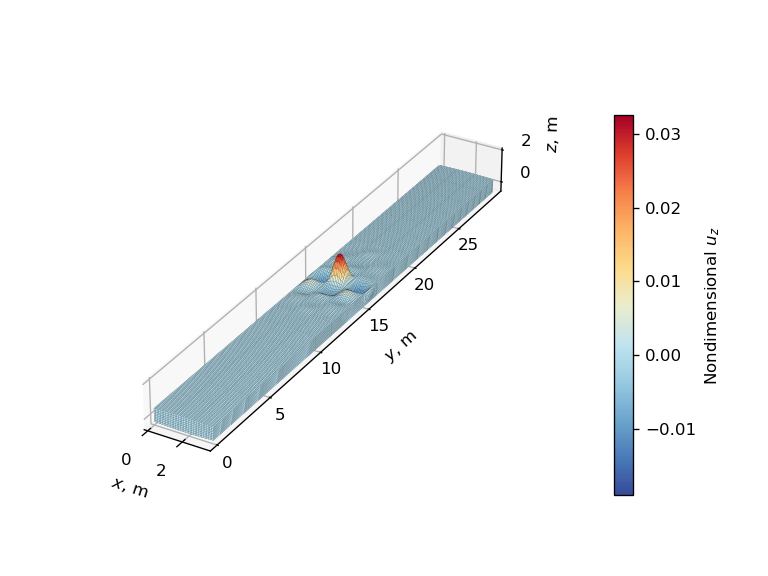

Eigenvector of instability 4, P/P_design=1.00:


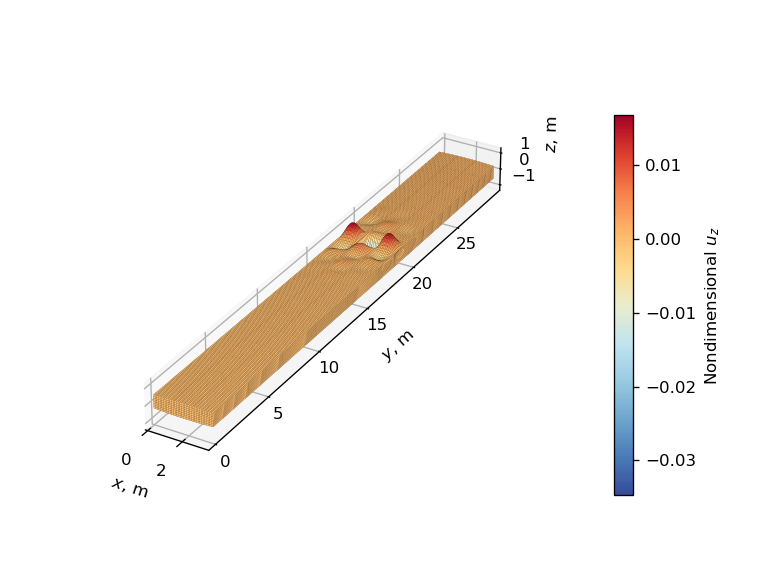

In [62]:
# Find the indices corresponding to the instabilities
sol_106_op2 = nonlinear_problem['nastran_solver.op2']  # get OP2 object from the problem
eigenvalues = pynastran_utils.read_kllrh_lowest_eigenvalues_from_op2(
    sol_106_op2)  # read eigenvalues from OP2 object
eigenvectors_key = next(iter(sol_106_op2.eigenvectors))  # get the key of the subcase containing the eigenvectors
increment_instability_indices, plot_instability_indices =\
    find_negative_eigenvalue_increases(
        eigenvalues, sol_106_op2.eigenvectors[eigenvectors_key].eigrs)

# Plot the eigenvectors of the first three instabilities
amplification_factor = 50
for i in range(3):
    print(f"Eigenvector of instability {i + 1}, P/P_design={nondimensional_loads[increment_instability_indices[i]]:.2f}:")
    _, ax, cbar = plot_utils.plot_eigenvector(
        op2=sol_106_op2, subcase_id=eigenvectors_key,
        eigenvector_number=plot_instability_indices[i] + 1,
        displacement_component='tz', colormap='sunset',
        displacement_amplification_factor=amplification_factor)
    adjust_3d_plot(ax, cbar)
    plt.show()
    
# Plot eigenvector of the fourth instability
# Skip i=3 because it corresponds to a second eigenvalue becoming negative, not real snap-through
i = 4
print(f"Eigenvector of instability {i}, P/P_design={nondimensional_loads[increment_instability_indices[i]]:.2f}:")
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_106_op2, subcase_id=eigenvectors_key,
    eigenvector_number=plot_instability_indices[i] + 1,
    displacement_component='tz', colormap='sunset',
    displacement_amplification_factor=amplification_factor)
adjust_3d_plot(ax, cbar)
plt.show()

### Nonlinear structural stability optimization <a name="lra-nonlinear-optimization"></a>

Store initial values of design variables, constraints and objective function.

In [63]:
# Scale load to design load, change DMAP and run model
sol_106_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = 1.  # scale applied load to frozen aerodynamic load
sol_106_bdf.executive_control_lines[1] = dmap_stop  # change DMAP command to stop the analysis after the first negative eigenvalue is found
input_name = "sol_106_lra_nonlinear_opt_start"
nonlinear_problem.model.nastran_solver.options['input_name'] = input_name
sol_106_bdf.nlpcis[1].mxinc = 250  # decrease maximum number of increments to speed up optimization
nonlinear_problem.run_model()

# Store and print initial KS values and mass
ks_stability_0 = nonlinear_problem["nastran_solver.ks_stability"][0]
ks_stress_0 = nonlinear_problem["nastran_solver.ks_stress"][0]
mass_0 = nonlinear_problem['nastran_solver.mass'][0]
print(f"""Initial KS value for stability: {ks_stability_0:.3f} N/m
Initial KS value for stress: {ks_stress_0:.3e} Pa
Initial mass: {mass_0:.0f} kg""")

Nastran job sol_106_lra_nonlinear_opt_start.bdf completed
Wall time: 12131.0 s
Initial KS value for stability: 0.028 N/m
Initial KS value for stress: -2.897e+08 Pa
Initial mass: 7817 kg


Set up design variables, constraints and objective function for the optimization.

In [64]:
# Set default input values of sol_106 component
nonlinear_problem.model.set_input_defaults(
    'interp.t_cp', linear_opt_thickness_vector)
input_name = "sol_106_lra_nonlinear_opt"
nonlinear_problem.model.options['input_name'] = input_name

# Choose optimizer
nonlinear_problem.driver = om.ScipyOptimizeDriver()
nonlinear_problem.driver.options['optimizer'] = 'COBYLA'
nonlinear_problem.driver.options['tol'] = OPTIMIZER_TOLERANCE

# Add design variable, objective and constraints
nonlinear_problem.model.add_design_var(
    'interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1],
    ref0=thickness_bounds[0], ref=linear_opt_thickness_vector[0])  # scale thickness so that the lower bound is 0 and initial value at root is 1
nonlinear_problem.model.add_objective(
    'nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
nonlinear_problem.model.add_constraint(
    'nastran_solver.ks_stability', upper=0., ref=eigenvalues[0][0])  # scale KS function for nonlinear structural stability so that the initial value is 1
nonlinear_problem.model.add_constraint(
    'nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1
nonlinear_problem.model.add_constraint('nastran_solver.load_factor', lower=.99)  # final applied load should be at least 99% of the design load

Run optimization and plot optimization history.

Requested variables at last iteration:
- interp.t_cp: [0.01668137 0.00159906]
- nastran_solver.ks_stability: [0.01482283]
- nastran_solver.ks_stress: [-2.96895168e+08]
- nastran_solver.load_factor: [0.99001604]
- nastran_solver.mass: [7854.34768751]


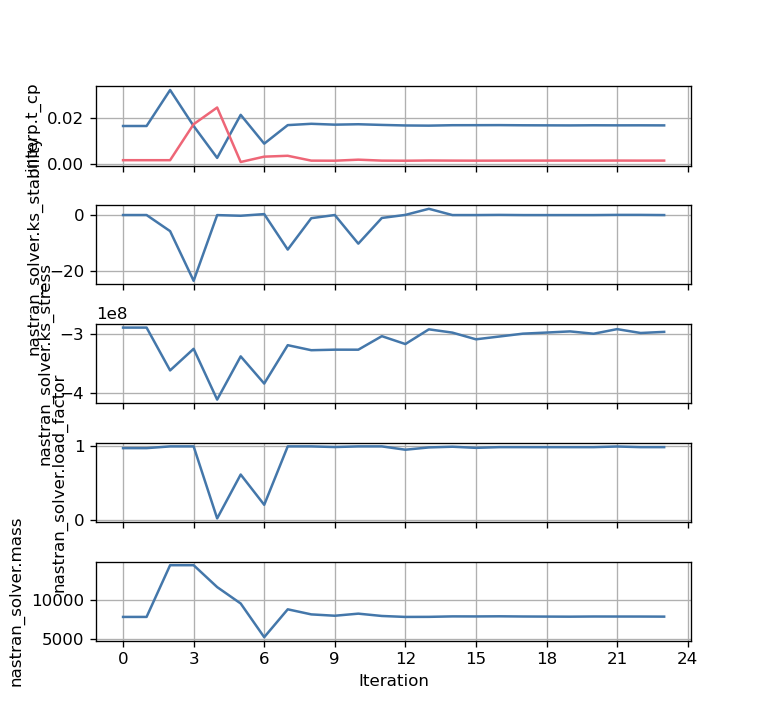

In [65]:
# Add recorder
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
nonlinear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
nonlinear_problem.setup()  # re-setup problem
nonlinear_problem.set_solver_print(0)  # disable solver output
nonlinear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    nonlinear_problem.run_driver()  # run optimization
nonlinear_problem.cleanup()  # clean up problem

# Plot optimization history and print results
_, _, nonlinear_opt_histories = optimization_utils.plot_optimization_history(
    recorder_filepath)  # plot optimization history

The optimization employs about 59.2 hours to complete and ends on an unfeasible design point (positive stability constraint function value). Let's find the last feasible design and print the final values of design variables, constraints and objective.

In [66]:
# Find index of last feasible design
feasible_design_index = np.where(
    nonlinear_opt_histories['nastran_solver.ks_stability'][:, 0] <\
        OPTIMIZER_TOLERANCE)[0][-1]

# Print design variables, constraints and objective at last feasible iteration
print("Design variables, constraints and objective at last feasible iteration:")
for key in nonlinear_opt_histories:
    print(f"- {key}: {nonlinear_opt_histories[key][feasible_design_index]}")

# Find and print mass percentage variation w.r.t. initial structure
mass_percentage_variation = (nonlinear_opt_histories['nastran_solver.mass'][
    feasible_design_index, 0]/mass_0 - 1)*100
print(f"""
Mass variation w.r.t. linearly optimized structure: {mass_percentage_variation:.1f} %""")

Design variables, constraints and objective at last feasible iteration:
- interp.t_cp: [0.01688266 0.00159439]
- nastran_solver.ks_stability: [-1.00968892]
- nastran_solver.ks_stress: [-3.04189888e+08]
- nastran_solver.load_factor: [1.]
- nastran_solver.mass: [7938.8265504]

Mass variation w.r.t. linearly optimized structure: 1.6 %


Once again the nonlinear structural stability optimization does not manage to reduce the mass, however this time we only have a 1.6% increase in the total mass.

In [67]:
# Increase applied load and maximum number of increments
sol_106_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = 2.
sol_106_bdf.nlpcis[1].mxinc = 450

# Change DMAP command
sol_106_bdf.executive_control_lines[1] = dmap_eigenvectors_stop

# Assign thickness vector of last feasible design
nonlinear_opt_thickness_vector = nonlinear_opt_histories['interp.t_cp'][
    feasible_design_index]
nonlinear_problem.set_val('interp.t_cp', nonlinear_opt_thickness_vector)

# Run analysis of last feasible design
input_name = "sol_106_lra_nonlinear_opt_feasible"
nonlinear_problem.model.nastran_solver.options['input_name'] = input_name
nonlinear_problem.run_model()

Nastran job sol_106_lra_nonlinear_opt_feasible.bdf completed
Wall time: 9652.0 s


We plot the eigenvalue diagram and the eigenvector corresponding to the critical instability mode.

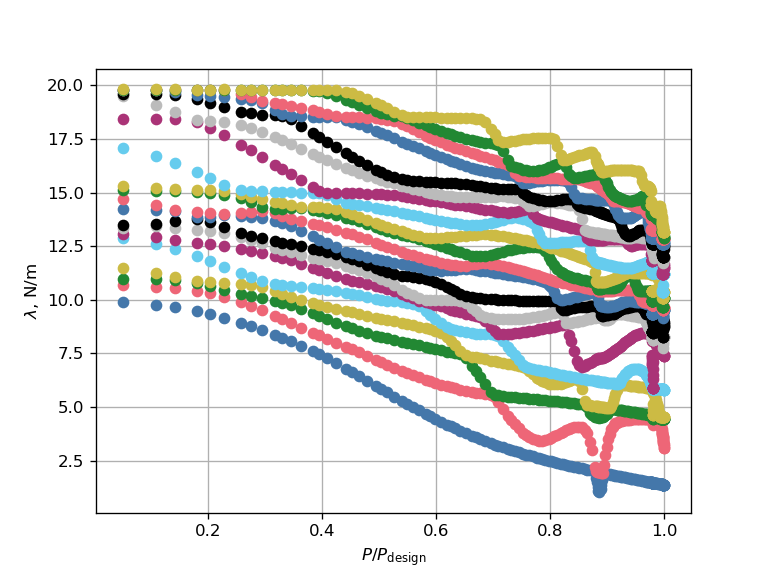

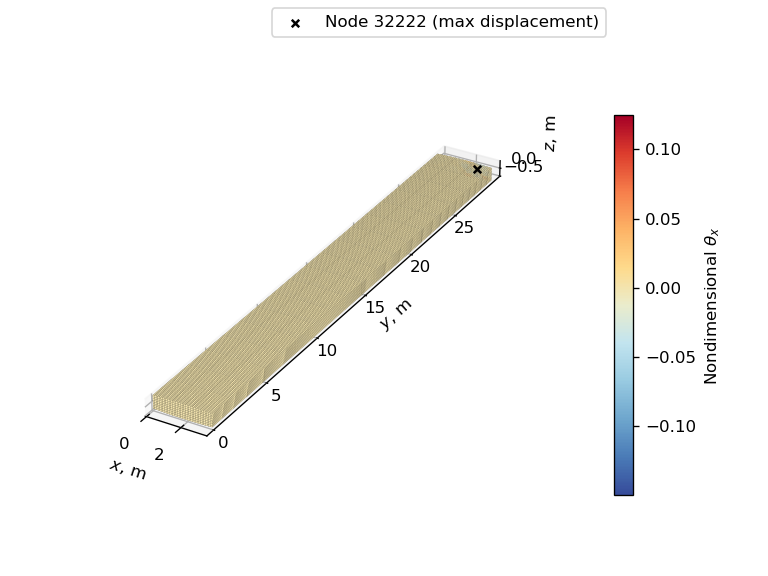

In [68]:
# Read load history
sol_106_op2 = nonlinear_problem['nastran_solver.op2']
load_factors, _, _ = pynastran_utils.read_load_displacement_history_from_op2(
    sol_106_op2)

# Get the id of the subcase
subcase_id = next(iter(load_factors))

# Read eigenvalues of tangent stiffness matrix
eigenvalues = pynastran_utils.read_kllrh_lowest_eigenvalues_from_op2(
    sol_106_op2)

# Plot eigenvalues vs applied load
_, ax = plot_utils.plot_eigenvalue_diagram(
    load_factors[subcase_id], eigenvalues)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

# Get the key of the dictionary containing the eigenvectors
eigenvectors_key = next(iter(sol_106_op2.eigenvectors))

# Plot eigenvector corresponding to lowest eigenvalue of last increment
critical_eigenvector_number = -NO_EIGENVALUES + 1
amplification_factor = 10
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_106_op2, subcase_id=eigenvectors_key,
    eigenvector_number=critical_eigenvector_number,
    displacement_component='rx', colormap='sunset',
    displacement_amplification_factor=amplification_factor)

# Plot maximum displacement node
max_displacement_node_id = plot_utils.plot_max_displacement_node(
    axes=ax, op2=sol_106_op2, subcase_id=eigenvectors_key,
    eigenvector_number=critical_eigenvector_number,
    displacement_amplification_factor=amplification_factor)

# Add legend and show plot
ax.legend()
adjust_3d_plot(ax, cbar)
plt.show()

Now we run the linear buckling analysis of the nonlinearly optimized structure to find the linear buckling load and the corresponding critical mode shape.

Nastran job sol_105_lra_nonlinear_opt.bdf completed
Wall time: 25.0 s
P_SOL 105/P_design = 0.74
Critical buckling mode:


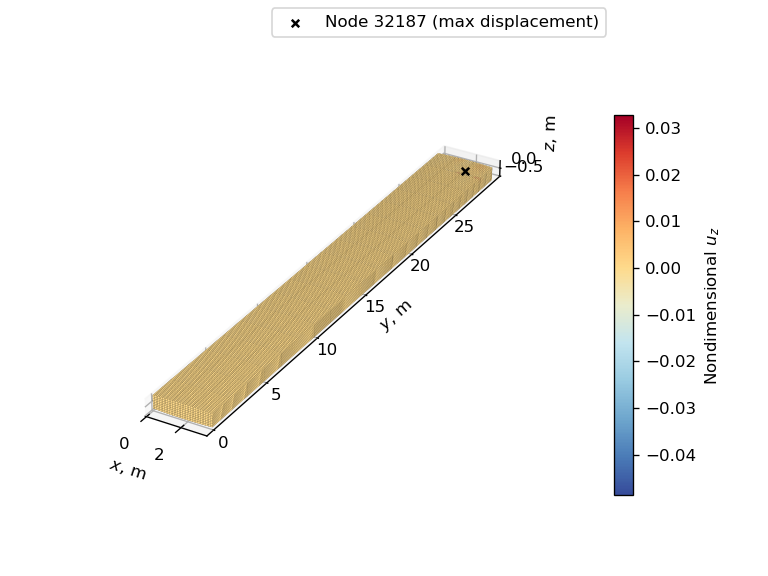

In [69]:
# Define load reference axis
sol_105_lra_bdf = sol_105_bdf.__deepcopy__({})
define_load_reference_axis(sol_105_lra_bdf, struct_mesh)

# Apply frozen aerodynamic load obtained from SOL 144
pch_filename = "sol_144_lra_linear_opt_feasible.pch"
sol_105_lra_bdf.add_include_file(pch_filename)

# Create NastranGroup object for linear buckling analysis
input_name = "sol_105_lra_nonlinear_opt"
sol_105_group = optimization_utils.NastranGroup(
        bdf=sol_105_lra_bdf, analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
        input_name=input_name, run_flag=False, yield_strength=SIGMA_Y)  # create NastranGroup object

# Add thickness spline component and connect it to the NastranSolver component
sol_105_group.add_subsystem('interp', thickness_interp_comp)
sol_105_group.connect('interp.t_val', 'nastran_solver.t_val')

# Set up nonlinear OpenMDAO problem
linear_buckling_problem = om.Problem(
        model=sol_105_group, name="lra_linear_buckling")
linear_buckling_problem.setup()

# Assign initial thickness distribution and run model
linear_buckling_problem.set_val('interp.t_cp', nonlinear_opt_thickness_vector)  # assign thickness array to spline component input
linear_buckling_problem.run_model()  # run analysis

# Retrieve OP2 object of nonlinear analysis and print buckling load
sol_105_op2 = linear_buckling_problem['nastran_solver.op2']  # get OP2 object from the problem
nonlinear_opt_blf = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigrs[0]
print(f"P_SOL 105/P_design = {nonlinear_opt_blf:.2f}")

# Plot buckling mode
print("Critical buckling mode:")
amplification_factor = 1.5  # amplification factor for displacements
_, ax, cbar = plot_utils.plot_eigenvector(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz',
    colormap='sunset', displacement_amplification_factor=amplification_factor)

# Plot maximum displacement node and add legend
max_displacement_node_id = plot_utils.plot_max_displacement_node(
    axes=ax, op2=sol_105_op2,
    displacement_amplification_factor=amplification_factor)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

Plot deformation at the design load.

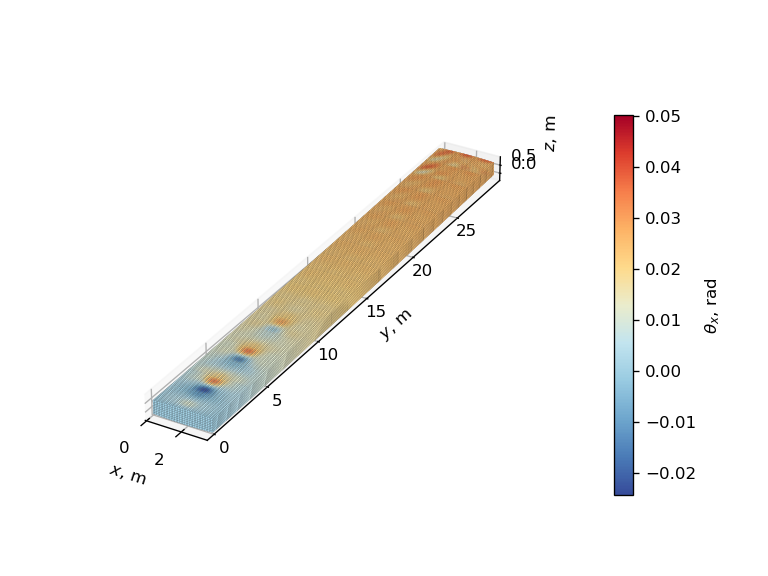

In [70]:
_, ax, cbar = plot_utils.plot_deformation(
    op2=sol_106_op2, subcase_id=subcase_id, displacement_component='rx',
    colormap='sunset')
adjust_3d_plot(ax, cbar)
plt.show()